In [2]:
#!/usr/bin/env python3
#pip install  rioxarray==0.3.1
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import rioxarray
import numpy as np
import geopandas as gpd
import cartopy.crs as ccrs
import rasterio
import os
import matplotlib.colors
scriptsdir = os.getcwd()
from scipy.interpolate import griddata
from functools import reduce
import xarray
import itertools
import argparse
import matplotlib.colors as mcolors
import warnings
import cartopy.feature as cfeature

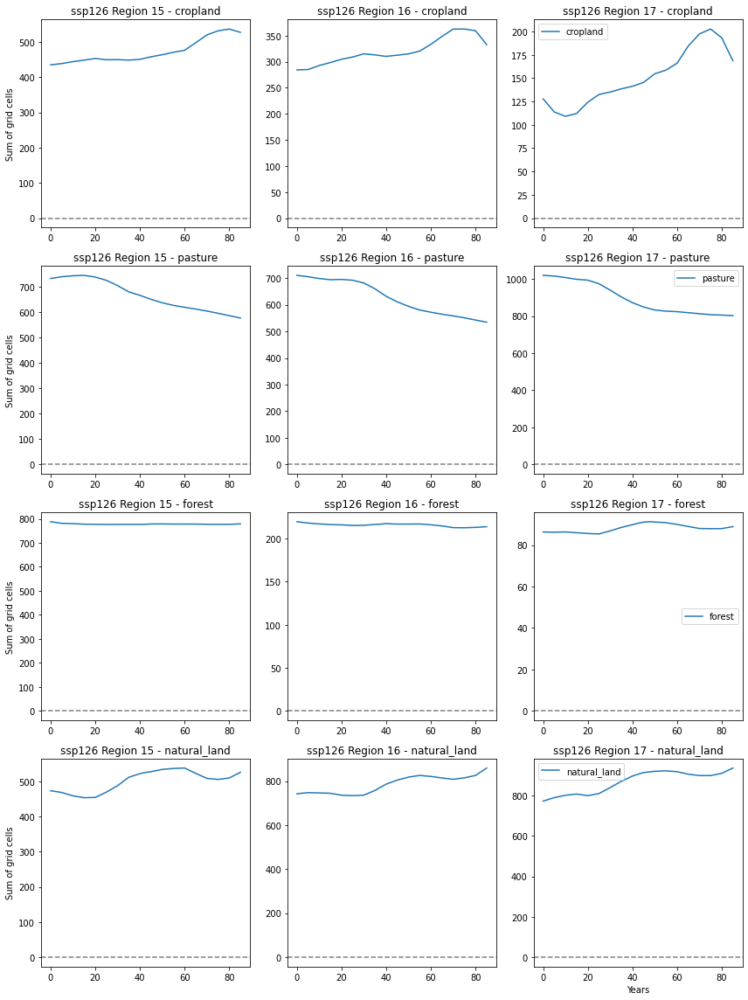

In [9]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np

region_numbers = [15, 16, 17]

# Define categories
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Load the land use dataset for the specified regions
num_regions = len(region_numbers)
num_categories = len(category_mapping.keys())
fig, axes = plt.subplots(nrows=num_categories, ncols=num_regions, figsize=(4*num_regions, 4*num_categories))

for i, region_number in enumerate(region_numbers):
    # Load the land use dataset
    da_landuse = xr.open_dataset(f"/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126_region{region_number}.nc", decode_times=False)
    # Get the time values
    time = da_landuse['time'].values
    
    # Initialize a new dataset for sum over categories
    sum_over_categories = xr.Dataset()

    # Sum the categories for the land use dataset
    for category, vars_in_category in category_mapping.items():
        sum_over_categories[category] = sum(da_landuse[var] for var in vars_in_category)

    # Loop over the categories
    for j, category in enumerate(sum_over_categories.data_vars):
        # Get the sum of values for the current category
        values = sum_over_categories[category].sum(dim=['lat', 'lon']).values

        # Plot the sum values for the current category in the corresponding subplot
        ax = axes[j, i]
        ax.plot(time, values, label=category)

        # Set the y-axis label for the leftmost subplots
        if i == 0:
            ax.set_ylabel('Sum of grid cells')

        # Add a horizontal line at y=0.0
        ax.axhline(y=0.0, color='grey', linestyle='--')

        # Set the title with region number and category name
        region_name = region_numbers[i]
        ax.set_title(f'ssp126 Region {region_name} - {category}')

        # Add a legend to the last column subplots
        if i == num_regions - 1:
            ax.legend()

    # Set the x-axis label for the bottom subplots
    if i == num_regions - 1:
        axes[-1, i].set_xlabel('Years')

# Adjust the layout to display plots neatly
plt.tight_layout()

# Display the plots
plt.show()


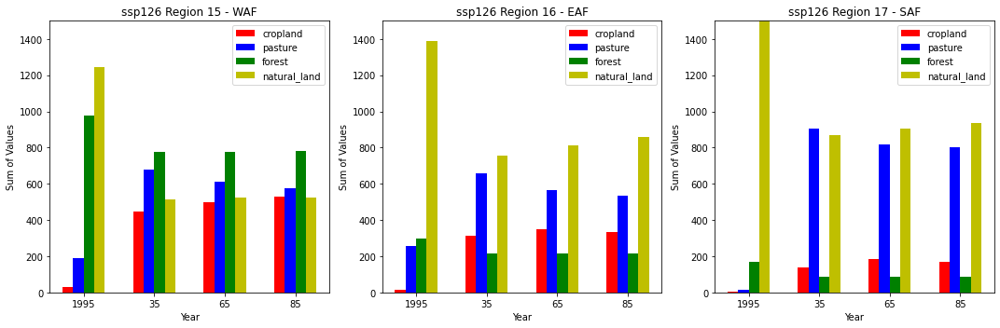

In [37]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np

# Region abbreviations and their corresponding numbers
region_mapping = {'WAF': 15, 'EAF': 16, 'SAF': 17}

# Years for which to plot data
years_to_plot = [1995, 35, 65, 85]

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create plot
fig, ax = plt.subplots(nrows=1, ncols=len(region_mapping), figsize=(15, 5))

bar_width = 0.15
colors = ['r', 'b', 'g', 'y']

for i, (region_abbrev, region_number) in enumerate(region_mapping.items()):
    # Load land use dataset for historic period
    LUH_historic = f"/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical_region{region_number}.nc"
    da_historic = xr.open_dataset(LUH_historic, decode_times=False)
    da_historic = da_historic.isel(time=0)

    # Create a new dataset for sum over categories for historic period
    sum_over_categories_historic = xr.Dataset()

    # Sum the values for each category in the historic period
    for category, vars_in_category in category_mapping.items():
        sum_over_categories_historic[category] = sum(da_historic[var] for var in vars_in_category)

    # Calculate the total sum per category for the historic period
    grid_sums_historic = {category: sum_over_categories_historic[category].sum(dim=['lat', 'lon']).values.item() for category in sum_over_categories_historic.data_vars}

    # Iterate over the years to plot
    for j, year in enumerate(years_to_plot):
        # Load land use dataset for specific year
        if year == 1995:
            da_landuse = da_historic
        else:
            LUH_data = f"/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126_region{region_number}.nc"
            da_landuse = xr.open_dataset(LUH_data, decode_times=False)
            da_landuse = da_landuse.sel(time=year)

        # Create a new dataset for sum over categories
        sum_over_categories = xr.Dataset()

        # Sum the values for each category
        for category, vars_in_category in category_mapping.items():
            sum_over_categories[category] = sum(da_landuse[var] for var in vars_in_category)

        # Calculate the total sum per category
        grid_sums = {category: sum_over_categories[category].sum(dim=['lat', 'lon']).values for category in sum_over_categories.data_vars}

        # Plot the bar chart
        for k, (category, sums) in enumerate(grid_sums.items()):
            positions = [r + k * bar_width for r in range(len(years_to_plot))]
            if year == 1995:
                ax[i].bar(positions[j], grid_sums_historic[category], bar_width, label=category, color=colors[k])
            else:
                ax[i].bar(positions[j], sums, bar_width, color=colors[k])

        # Add legend to each subplot
        if j == 0:
            ax[i].legend(loc='upper right')

    # Set title and labels
    ax[i].set_title(f'ssp126 Region {region_number} - {region_abbrev}')
    ax[i].set_xticks([r + bar_width * 1.5 for r in range(len(years_to_plot))])
    ax[i].set_xticklabels(years_to_plot)
    ax[i].set_xlabel('Year')
    ax[i].set_ylabel('Sum of Values')
    ax[i].set_ylim(0, 1500)

# Adjust the layout to display plots neatly
plt.tight_layout()

# Show plot
plt.show()


/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


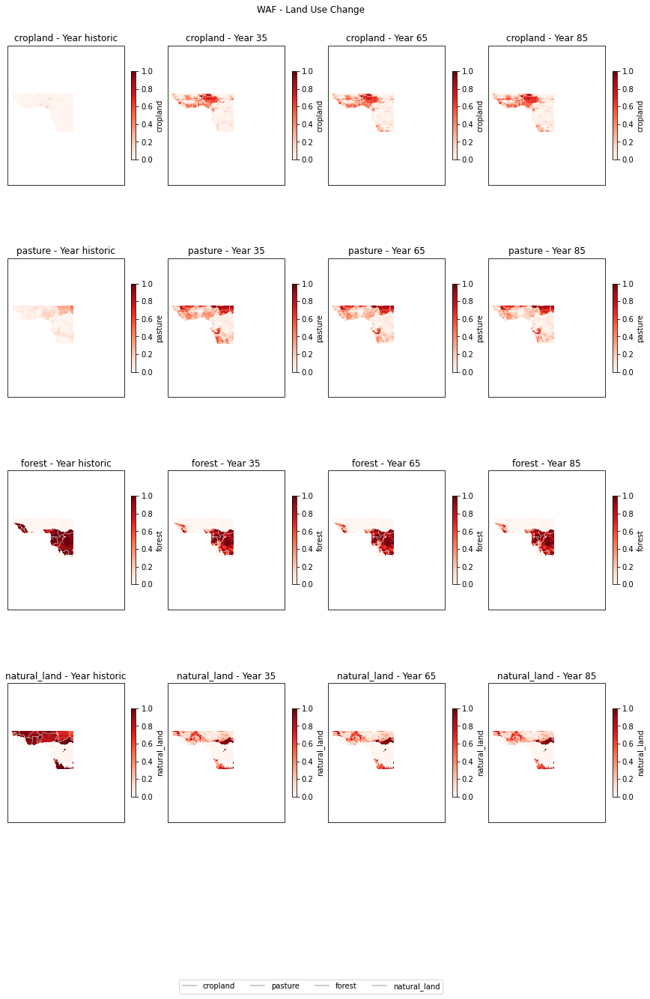

/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


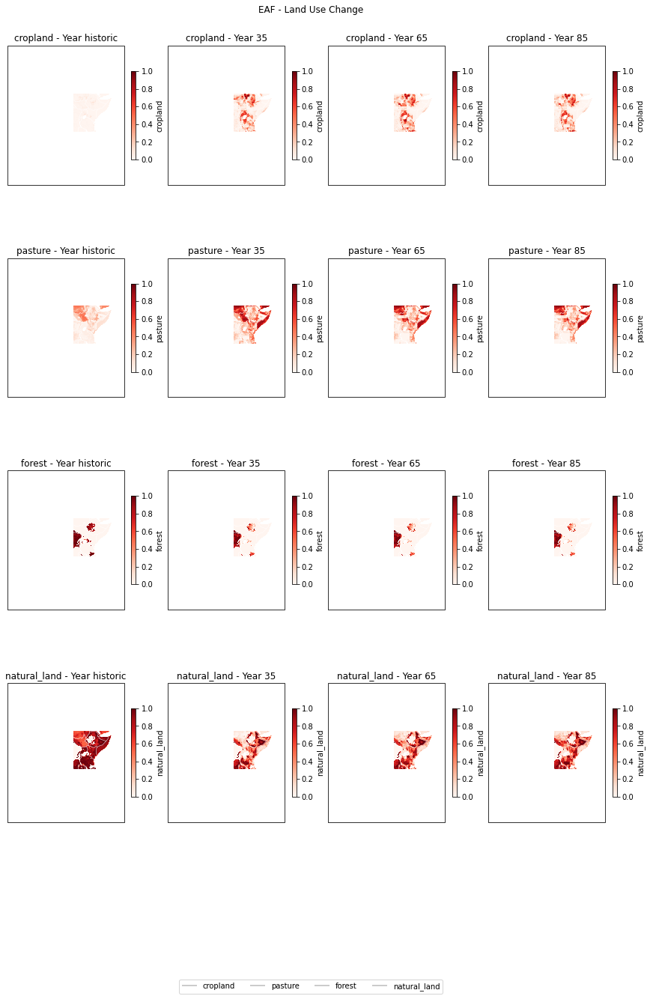

/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


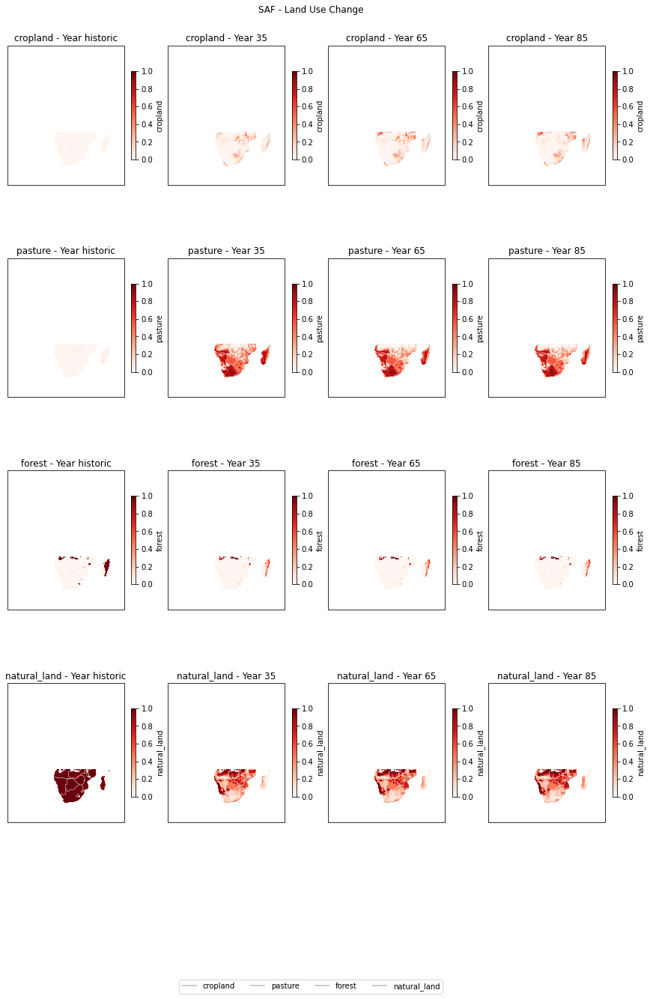

In [36]:
import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import xarray as xr

# Region abbreviations and their corresponding numbers
region_mapping = {'WAF': 15, 'EAF': 16, 'SAF': 17}

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Years for which to plot data
years_to_plot = ['historic', 35, 65, 85]

# Plot each region separately
for region_abbrev, region_number in region_mapping.items():
    # Create a new figure and axes for the current region
    fig, axes = plt.subplots(nrows=len(category_mapping), ncols=len(years_to_plot), figsize=(15, 20), subplot_kw={'projection': ccrs.PlateCarree()})

    # Iterate over the categories to plot
    for i, category in enumerate(category_mapping.keys()):
        # Iterate over the years to plot
        for j, year in enumerate(years_to_plot):
            # Load land use dataset for specific year
            if year == 'historic':
                LUH_historic = f"/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical_region{region_number}.nc"
                da_landuse = xr.open_dataset(LUH_historic, decode_times=False)
                da_landuse = da_landuse.isel(time=0)
            else:
                LUH_data = f"/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126_region{region_number}.nc"
                da_landuse = xr.open_dataset(LUH_data, decode_times=False)
                da_landuse = da_landuse.sel(time=year)

            # Create a new dataset for sum over categories
            sum_over_categories = xr.Dataset()

            # Sum the values for the current category
            sum_over_categories[category] = sum(da_landuse[var] for var in category_mapping[category])

            # Calculate the total sum for the category
            grid_sums = {category: sum_over_categories[category].sum(dim=['lat', 'lon']).values}

            # Plot the category on a lon-lat map
            ax = axes[i, j]
            im = sum_over_categories[category].plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap='Reds', ax=ax, vmin=0, vmax=1, cbar_kwargs={'shrink': 0.5})
            ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
            ax.set_title(f"{category} - Year {year}")
            ax.set_extent((-20, 60, -40, 40))

    # Add legend to the figure
    fig.legend(labels=category_mapping.keys(), loc='lower center', ncol=len(category_mapping), bbox_to_anchor=(0.5, -0.02))

    # Set figure title
    fig.suptitle(f"{region_abbrev} - Land Use Change", y=0.9)

    # Adjust
    plt.subplots_adjust(wspace=0.1, hspace=0.2)

    # Show the plot
    plt.show()


/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


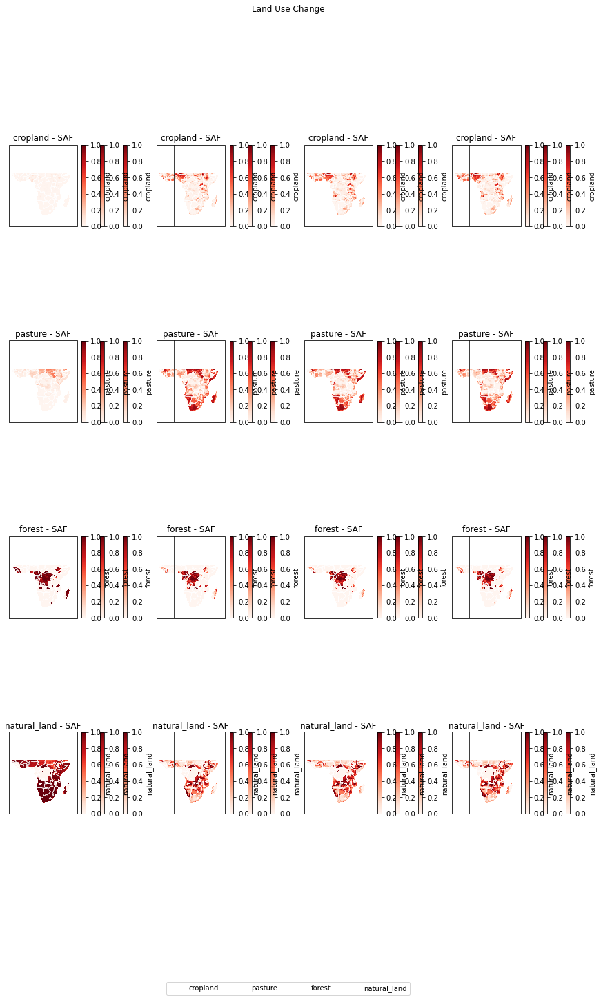

In [39]:
import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import xarray as xr

# Region abbreviations and their corresponding numbers
region_mapping = {'WAF': 15, 'EAF': 16, 'SAF': 17}

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Years for which to plot data
years_to_plot = ['historic', 35, 65, 85]

# Create a new figure and axes for the combined map
fig, axes = plt.subplots(nrows=len(category_mapping), ncols=len(years_to_plot), figsize=(15, 20), subplot_kw={'projection': ccrs.PlateCarree()})

# Iterate over the categories to plot
for i, category in enumerate(category_mapping.keys()):
    # Iterate over the years to plot
    for j, year in enumerate(years_to_plot):
        # Create a new axes for the sub-regions
        ax_combined = axes[i, j]

        # Iterate over the regions to plot
        for k, (region_abbrev, region_number) in enumerate(region_mapping.items()):
            # Load land use dataset for specific year and region
            if year == 'historic':
                LUH_historic = f"/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical_region{region_number}.nc"
                da_landuse = xr.open_dataset(LUH_historic, decode_times=False)
                da_landuse = da_landuse.isel(time=0)
            else:
                LUH_data = f"/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126_region{region_number}.nc"
                da_landuse = xr.open_dataset(LUH_data, decode_times=False)
                da_landuse = da_landuse.sel(time=year)

            # Create a new dataset for sum over categories
            sum_over_categories = xr.Dataset()

            # Sum the values for the current category
            sum_over_categories[category] = sum(da_landuse[var] for var in category_mapping[category])

            # Calculate the total sum for the category
            grid_sums = {category: sum_over_categories[category].sum(dim=['lat', 'lon']).values}

            # Plot the category on a lon-lat map
            ax = ax_combined
            im = sum_over_categories[category].plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap='Reds', ax=ax, vmin=0, vmax=1, cbar_kwargs={'shrink': 0.5})
            ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
            ax.set_title(f"{category} - {region_abbrev}")
            ax.set_extent((-20, 60, -40, 40))

            if region_abbrev != 'SAF':
                ax.axvline(0, color='black', linewidth=0.5)

        # Adjust spacing between subplots within the combined map
        plt.subplots_adjust(wspace=0.1)

# Add legend to the combined map
fig.legend(labels=category_mapping.keys(), loc='lower center', ncol=len(category_mapping), bbox_to_anchor=(0.5, -0.02))

# Set figure title
fig.suptitle("Land Use Change")

# Adjust spacing between subplots of the combined map
plt.subplots_adjust(wspace=0.1, hspace=0.2)

# Show the plot
plt.show()


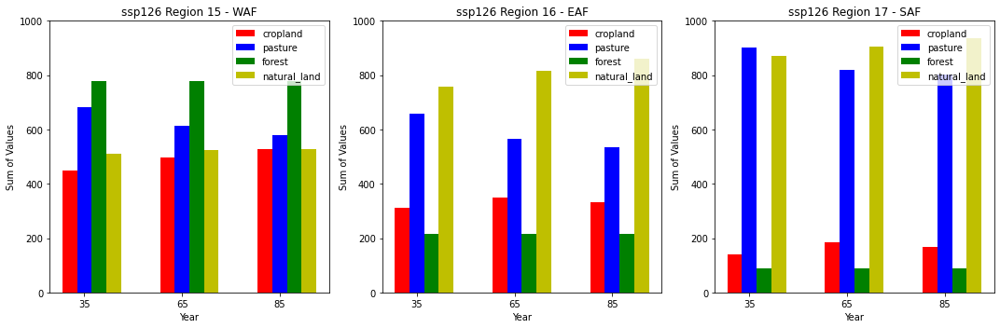

In [16]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np

# Region abbreviations and their corresponding numbers
region_mapping = {'WAF': 15, 'EAF': 16, 'SAF': 17}

# Years for which to plot data
years_to_plot = [35, 65, 85]

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create plot
fig, ax = plt.subplots(nrows=1, ncols=len(region_mapping), figsize=(15, 5))

bar_width = 0.15
colors = ['r', 'b', 'g', 'y']

for i, (region_abbrev, region_number) in enumerate(region_mapping.items()):
    # Load land use dataset for region
    da_landuse = xr.open_dataset(f"/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126_region{region_number}.nc", decode_times=False)

    # Select only the required years
    da_landuse = da_landuse.sel(time=years_to_plot)

    # Create a new dataset for sum over categories
    sum_over_categories = xr.Dataset()

    # Sum the values for each category and year
    for category, vars_in_category in category_mapping.items():
        sum_over_categories[category] = sum(da_landuse[var] for var in vars_in_category)

    # Calculate the total sum per category and year
    grid_sums = {category: sum_over_categories[category].sum(dim=['lat', 'lon']).values for category in sum_over_categories.data_vars}

    for j, (category, sums) in enumerate(grid_sums.items()):
        positions = [k + j * bar_width for k in range(len(years_to_plot))]
        ax[i].bar(positions, sums, bar_width, label=category, color=colors[j])

    # Set title and labels
    ax[i].set_title(f'ssp126 Region {region_number} - {region_abbrev}')
    ax[i].set_xticks([r + bar_width for r in range(len(years_to_plot))])
    ax[i].set_xticklabels(years_to_plot)
    ax[i].set_xlabel('Year')
    ax[i].set_ylim(0, 1000)

    ax[i].set_ylabel('Sum of Values')

    # Add legend
    ax[i].legend(loc='upper right')

# Adjust the layout to display plots neatly
plt.tight_layout()

# Show plot
plt.show()

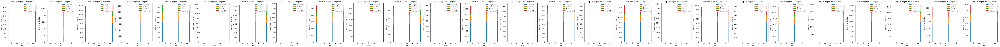

In [5]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np

# Region abbreviations and their corresponding numbers
region_mapping = {
    'Region1': 1,
    'Region2': 2,
    'Region3': 3,
    'Region4': 4,
    'Region5': 5,
    'Region6': 6,
    'Region7': 7,
    'Region8': 8,
    'Region9': 9,
    'Region10': 10,
    'Region11': 11,
    'Region12': 12,
    'Region13': 13,
    'Region14': 14,
    'Region15': 15,
    'Region16': 16,
    'Region17': 17,
    'Region18': 18,
    'Region19': 19,
    'Region20': 20,
    'Region21': 21,
    'Region22': 22,
    'Region23': 23,
    'Region24': 24,
    'Region25': 25,
    'Region26': 26,
}


# Years for which to plot data
years_to_plot = [35, 65, 85]

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create plot
num_regions = len(region_mapping)
fig, ax = plt.subplots(nrows=1, ncols=num_regions, figsize=(4*num_regions, 5))

for i, (region_abbrev, region_number) in enumerate(region_mapping.items()):
    # Load land use dataset for region
    da_landuse = xr.open_dataset(f"/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126_region{region_number}.nc", decode_times=False)

    # Select only the required years
    da_landuse = da_landuse.sel(time=years_to_plot)

    # Create a new dataset for sum over categories
    sum_over_categories = xr.Dataset()

    # Count the number of grid cells per category and year
    for category, vars_in_category in category_mapping.items():
        sum_over_categories[category] = (sum(da_landuse[var] > 0 for var in vars_in_category)).astype(int)

    # Calculate the grid cell counts per category and year
    grid_counts = {category: sum_over_categories[category].sum(dim=['lat', 'lon']).values for category in sum_over_categories.data_vars}

    # Plot a stacked bar chart for each category and year
    bottom = np.zeros(len(years_to_plot))
    for category, counts in grid_counts.items():
        ax[i].bar(years_to_plot, counts, label=category, bottom=bottom)
        bottom += counts  # increment the bottom location by the counts just plotted

    # Set title and labels
    ax[i].set_title(f'ssp126 Region {region_number} - {region_abbrev}')
    ax[i].set_xlabel('Year')
    ax[i].set_ylabel('Number of Grid Cells')

    # Add legend
    ax[i].legend(loc='upper right')

# Adjust the layout to display plots neatly
plt.tight_layout()

# Show plot
plt.show()


In [16]:
sum_over_categories['cropland'].sum()

<xarray.DataArray 'cropland' ()>
array(24284)
Coordinates:
    region   int64 17
    abbrevs  <U3 'SAF'
    names    <U9 'S. Africa'

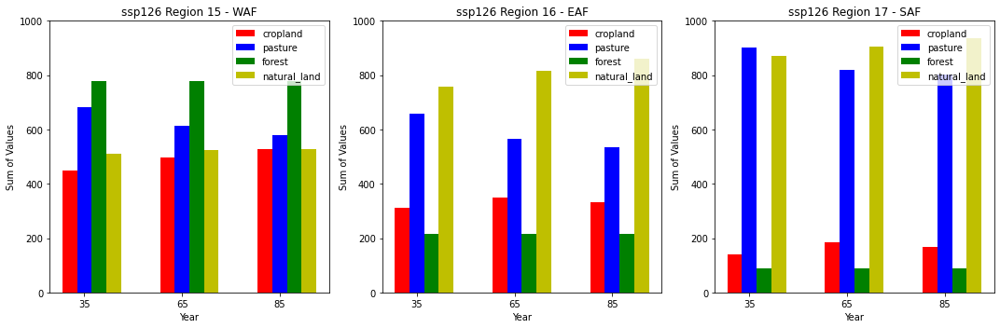

In [22]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np

# Region abbreviations and their corresponding numbers
region_mapping = {'WAF': 15, 'EAF': 16, 'SAF': 17}

# Years for which to plot data
years_to_plot = [35, 65, 85]

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create plot
fig, ax = plt.subplots(nrows=1, ncols=len(region_mapping), figsize=(15, 5))

bar_width = 0.15
colors = ['r', 'b', 'g', 'y']

for i, (region_abbrev, region_number) in enumerate(region_mapping.items()):
    # Load land use dataset for region
    da_landuse = xr.open_dataset(f"/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126_region{region_number}.nc", decode_times=False)

    # Select only the required years
    da_landuse = da_landuse.sel(time=years_to_plot)

    # Create a new dataset for sum over categories
    sum_over_categories = xr.Dataset()

    # Sum the values for each category and year
    for category, vars_in_category in category_mapping.items():
        sum_over_categories[category] = sum(da_landuse[var] for var in vars_in_category)

    # Calculate the total sum per category and year
    grid_sums = {category: sum_over_categories[category].sum(dim=['lat', 'lon']).values for category in sum_over_categories.data_vars}

    for j, (category, sums) in enumerate(grid_sums.items()):
        positions = [k + j * bar_width for k in range(len(years_to_plot))]
        ax[i].bar(positions, sums, bar_width, label=category, color=colors[j])

    # Set title and labels
    ax[i].set_title(f'ssp126 Region {region_number} - {region_abbrev}')
    ax[i].set_xticks([r + bar_width for r in range(len(years_to_plot))])
    ax[i].set_xticklabels(years_to_plot)
    ax[i].set_xlabel('Year')
    ax[i].set_ylim(0, 1000)

    ax[i].set_ylabel('Sum of Values')

    # Add legend
    ax[i].legend(loc='upper right')

# Adjust the layout to display plots neatly
plt.tight_layout()

# Show plot
plt.show()


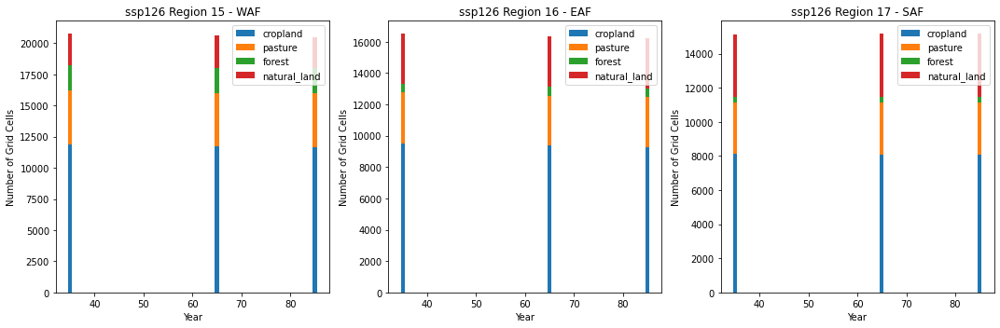

In [14]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np

# Region abbreviations and their corresponding numbers
region_mapping = {'WAF': 15, 'EAF': 16, 'SAF': 17}

# Years for which to plot data
years_to_plot = [35, 65, 85]

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create plot
fig, ax = plt.subplots(nrows=1, ncols=len(region_mapping), figsize=(15, 5))

for i, (region_abbrev, region_number) in enumerate(region_mapping.items()):
    # Load land use dataset for region
    da_landuse = xr.open_dataset(f"/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126_region{region_number}.nc", decode_times=False)

    # Select only the required years
    da_landuse = da_landuse.sel(time=years_to_plot)

    # Create a new dataset for sum over categories
    sum_over_categories = xr.Dataset()

    # Count the number of grid cells per category and year
    for category, vars_in_category in category_mapping.items():
        sum_over_categories[category] = (sum(da_landuse[var] > 0 for var in vars_in_category)).astype(int)

    # Calculate the grid cell counts per category and year
    grid_counts = {category: sum_over_categories[category].sum(dim=['lat', 'lon']).values for category in sum_over_categories.data_vars}

    # Plot a stacked bar chart for each category and year
    bottom = np.zeros(len(years_to_plot))
    for category, counts in grid_counts.items():
        ax[i].bar(years_to_plot, counts, label=category, bottom=bottom)
        bottom += counts  # increment the bottom location by the counts just plotted

    # Set title and labels
    ax[i].set_title(f'ssp126 Region {region_number} - {region_abbrev}')
    ax[i].set_xlabel('Year')
    ax[i].set_ylabel('Number of Grid Cells')

    # Add legend
    ax[i].legend(loc='upper right')

# Adjust the layout to display plots neatly
plt.tight_layout()

# Show plot
plt.show()


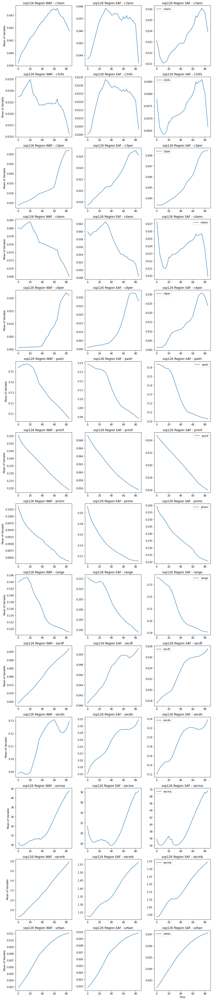

In [16]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np

region_abbrevs = ['WAF', 'EAF', 'SAF']

# Load the land use dataset for the specified regions
regions = [region_abbrevs.index(region)+15 for region in region_abbrevs]
num_regions = len(regions)
variable_names = [var for var in da_landuse.data_vars.keys() if var != 'time_bnds']
num_variables = len(variable_names)
fig, axes = plt.subplots(nrows=num_variables, ncols=num_regions, figsize=(4*num_regions, 4*num_variables))

for i, region_number in enumerate(regions):
    # Load the land use dataset
    da_landuse = xr.open_dataset(f"/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126_region{region_number}.nc", decode_times=False)

    # Loop over the variables
    for j, variable in enumerate(variable_names):
        # Get the mean values per timestep for the current variable and region
        mean_values = da_landuse[variable].mean(dim=['lat', 'lon']).values
        time = da_landuse['time'].values

        # Plot the mean values for the current variable in the corresponding subplot
        ax = axes[j, i]
        ax.plot(time, mean_values, label=variable)

        # Set the y-axis label for the leftmost subplots
        if i == 0:
            ax.set_ylabel('Mean of Variable')

        # Set the title with region number and variable name
        region_name = region_abbrevs[i]
        ax.set_title(f'ssp126 Region {region_name} - {variable}')

        # Add a legend to the last column subplots
        if i == num_regions - 1:
            ax.legend()

    # Set the x-axis label for the bottom subplots
    if i == num_regions - 1:
        axes[-1, i].set_xlabel('Time')

# Adjust the layout to display plots neatly
plt.tight_layout()

# Display the plots
plt.show()


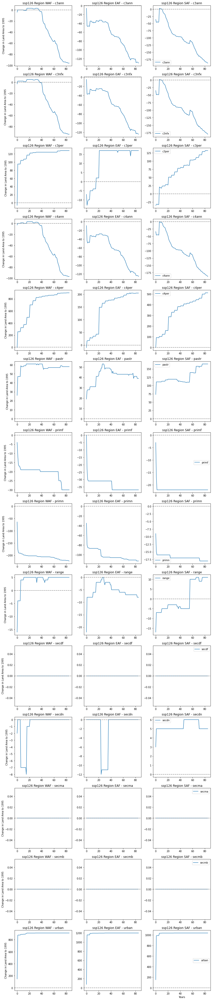

In [17]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np

region_abbrevs = ['WAF', 'EAF', 'SAF']

# Load the land use dataset for the specified regions
regions = [region_abbrevs.index(region)+15 for region in region_abbrevs]
num_regions = len(regions)
num_variables = len(variable_names)
fig, axes = plt.subplots(nrows=num_variables, ncols=num_regions, figsize=(4*num_regions, 4*num_variables))

for i, region_number in enumerate(regions):
    da_historic = xr.open_dataset(f"/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical_region{region_number}.nc", decode_times=False)
    da_historic = da_historic.isel(time=1146)

    # Initialize a dataset to store the sums for the historical dataset
    modified_landuse_historic = da_historic.copy()

    # Loop over the data variables and check if the fraction is larger than 0
    variable_names = [var for var in modified_landuse_historic.data_vars.keys() if var != 'time_bnds']
    for variable in variable_names:
        fraction = da_historic[variable]
        modified_landuse_historic[variable] = xr.where(fraction > 0, 1, 0)

    # Calculate the sum of values for each variable
    sum_over_values_historic = modified_landuse_historic.sum(dim=[dim for dim in modified_landuse_historic.dims if dim != 'time'])

    # Load the land use dataset
    da_landuse = xr.open_dataset(f"/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126_region{region_number}.nc", decode_times=False)
    # Get the time values
    time = da_landuse['time'].values

    # Initialize the modified land use dataset
    modified_landuse = da_landuse.copy()

    # Loop over the data variables and check if the fraction is larger than 0
    for variable in variable_names:
        fraction = da_landuse[variable]
        modified_landuse[variable] = xr.where(fraction > 0, 1, 0)

    # Calculate the sum of values for each variable
    sum_over_values = modified_landuse.sum(dim=[dim for dim in modified_landuse.dims if dim != 'time'])

    # Loop over the variables
    for j, variable in enumerate(variable_names):
        # Get the difference values for the current variable
        values = sum_over_values[variable].values - sum_over_values_historic[variable].values

        # Plot the difference values for the current variable in the corresponding subplot
        ax = axes[j, i]
        ax.plot(time, values, label=variable)

        # Set the y-axis label for the leftmost subplots
        if i == 0:
            ax.set_ylabel('Change in Land Area to 1995')

        # Add a horizontal line at y=0.0
        ax.axhline(y=0.0, color='grey', linestyle='--')

        # Set the title with region number and variable name
        region_name = region_abbrevs[i]
        ax.set_title(f'ssp126 Region {region_name} - {variable}')

        # Add a legend to the last column subplots
        if i == num_regions - 1:
            ax.legend()

    # Set the x-axis label for the bottom subplots
    if i == num_regions - 1:
        axes[-1, i].set_xlabel('Years')

# Adjust the layout to display plots neatly
plt.tight_layout()

# Display the plots
plt.show()


/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


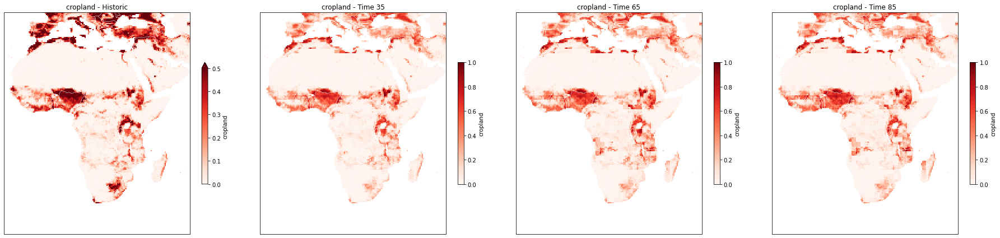

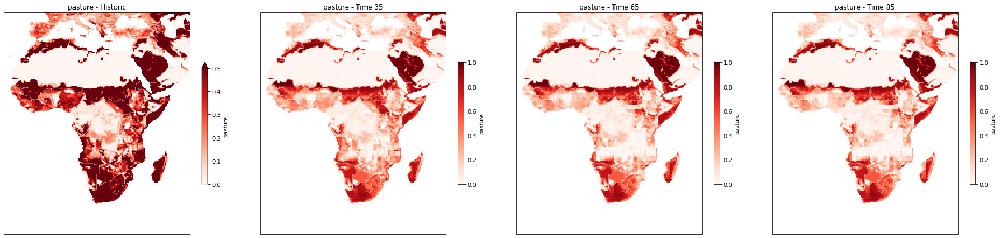

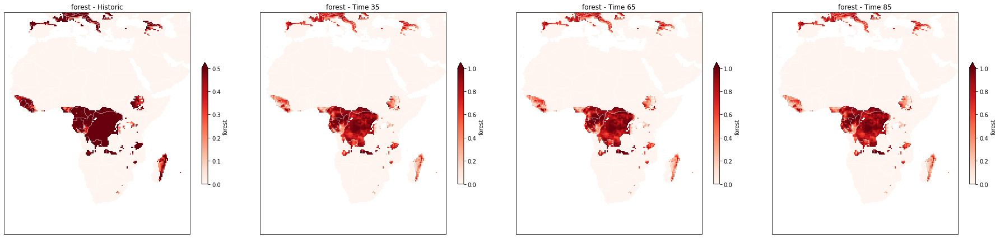

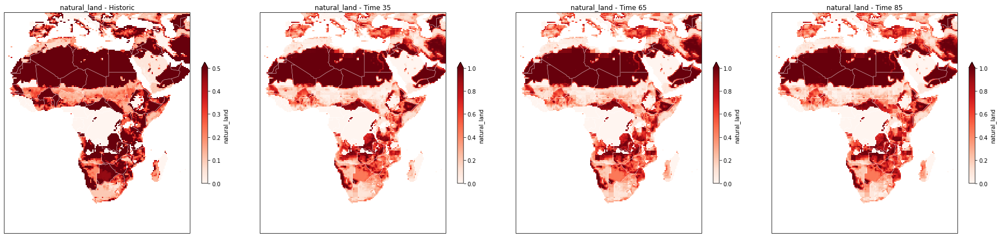

In [18]:
import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import xarray as xr

# Future LUH2
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"
ncfname = LandUseList
da_landuse = xr.open_dataset(ncfname, decode_times=False)
da_landuse = da_landuse.isel(time=[35, 65, 85])

LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"
da_historic = xr.open_dataset(LUH_historic, decode_times=False)
da_historic = da_historic.isel(time=1146)

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create a new dataset for sum over categories
sum_over_categories = xr.Dataset()

# Sum the categories for both datasets
for category, vars_in_category in category_mapping.items():
    sum_over_categories[category] = sum(da_landuse[var] for var in vars_in_category)
    da_historic[category] = sum(da_historic[var] for var in vars_in_category)

# Time points for future dataset
time_points = [35, 65, 85]

# Plot each category on a lon-lat map
for category in sum_over_categories.data_vars:
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(32, 8), subplot_kw={'projection': ccrs.PlateCarree()})

    # Plot the historic data in the first column
    ax = axes[0]
    im = da_historic[category].plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap='Reds', ax=ax, vmin=0, vmax=0.5, cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"{category} - Historic")
    ax.set_extent((-20, 60, -40, 40))

    # Plot future data for each selected time point in the remaining columns
    for i, time in enumerate(time_points):
        ax = axes[i+1]
        im = sum_over_categories[category].isel(time=i).plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap='Reds', ax=ax, vmin=0, vmax=1, cbar_kwargs={'shrink': 0.5})
        ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
        ax.set_title(f"{category} - Time {time}")
        ax.set_extent((-20, 60, -40, 40))

    # Adjust spacing between subplots
    plt.subplots_adjust(wspace=0.1)
    
    # Show the plot
    plt.show()


/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


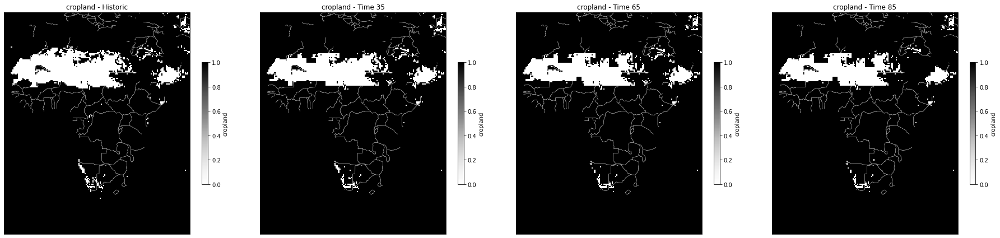

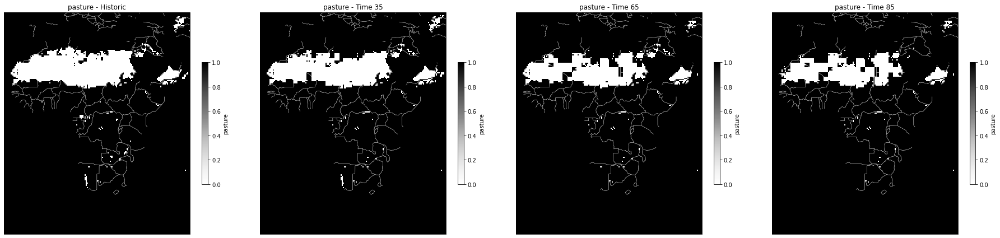

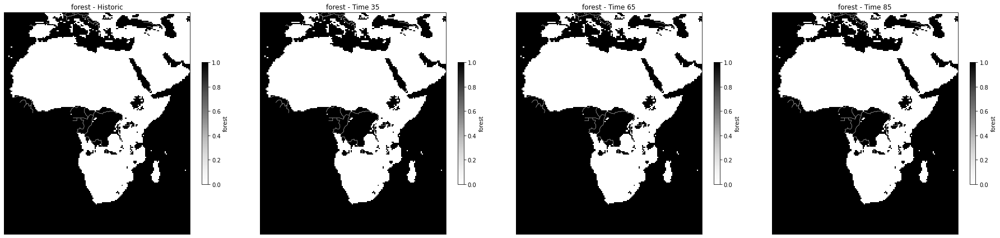

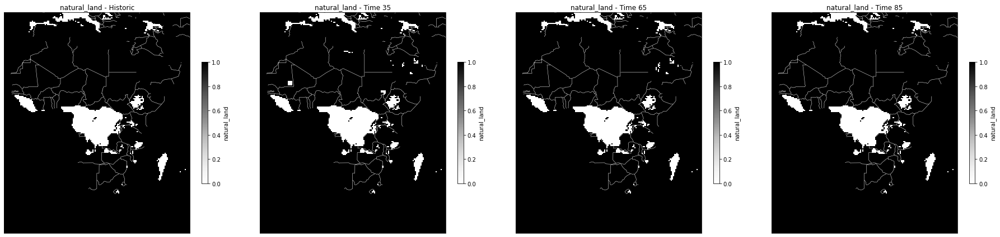

In [85]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import xarray as xr

# Future LUH2
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"
ncfname = LandUseList
da_landuse = xr.open_dataset(ncfname, decode_times=False)
da_landuse = da_landuse.isel(time=[35, 65, 85])

LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"
da_historic = xr.open_dataset(LUH_historic, decode_times=False)
da_historic = da_historic.isel(time=1146)

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create a new dataset for sum over categories
sum_over_categories = xr.Dataset()

# Sum the categories for both datasets
for category, vars_in_category in category_mapping.items():
    sum_over_categories[category] = sum(da_landuse[var] for var in vars_in_category)
    da_historic[category] = sum(da_historic[var] for var in vars_in_category)

# Time points for future dataset
time_points = [35, 65, 85]

# Plot each category on a lon-lat map
for category in sum_over_categories.data_vars:
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(32, 8), subplot_kw={'projection': ccrs.PlateCarree()})

    # Plot the historic data in the first column
    ax = axes[0]
    im = da_historic[category].astype(bool).plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap='Greys', ax=ax, vmin=0, vmax=1, cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"{category} - Historic")
    ax.set_extent((-20, 60, -40, 40))

    # Plot future data for each selected time point in the remaining columns
    for i, time in enumerate(time_points):
        ax = axes[i+1]
        im = sum_over_categories[category].astype(bool).isel(time=i).plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap='Greys', ax=ax, vmin=0, vmax=1, cbar_kwargs={'shrink': 0.5})
        ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
        ax.set_title(f"{category} - Time {time}")
        ax.set_extent((-20, 60, -40, 40))

    # Adjust spacing between subplots
    plt.subplots_adjust(wspace=0.1)
    
    # Show the plot
    plt.show()


/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


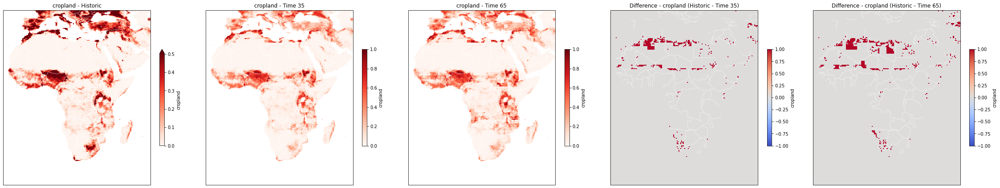

/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


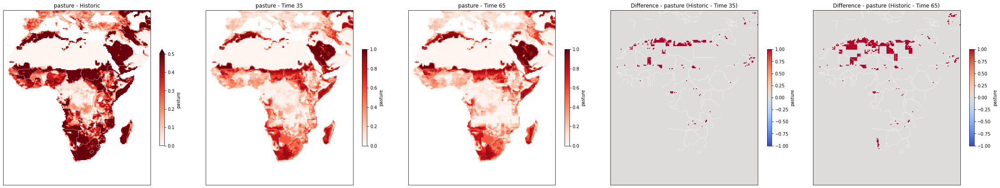

/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


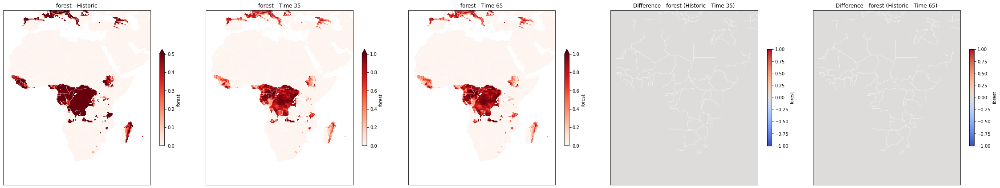

/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


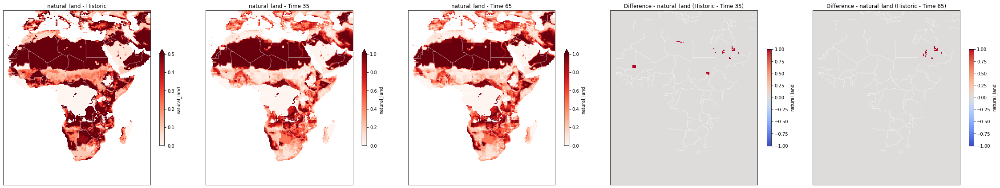

In [96]:
import matplotlib.pyplot as plt
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Future LUH2
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"
ncfname = LandUseList
da_landuse = xr.open_dataset(ncfname, decode_times=False)
da_landuse = da_landuse.isel(time=[35, 65])

LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"
da_historic = xr.open_dataset(LUH_historic, decode_times=False)
da_historic = da_historic.isel(time=1146)

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create a new dataset for sum over categories
sum_over_categories = xr.Dataset()

# Sum the categories for both datasets
for category, vars_in_category in category_mapping.items():
    sum_over_categories[category] = sum(da_landuse[var] for var in vars_in_category)
    da_historic[category] = sum(da_historic[var] for var in vars_in_category)

# Time points for future dataset
time_points = [35, 65]

# Plot each category on a lon-lat map
for category in sum_over_categories.data_vars:
    fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(40, 8), subplot_kw={'projection': ccrs.PlateCarree()})

    # Plot the historic data in the first column
    ax = axes[0]
    im = da_historic[category].plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap='Reds', ax=ax, vmin=0, vmax=0.5, cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"{category} - Historic")
    ax.set_extent((-20, 60, -40, 40))

    # Plot future data for each selected time point in the second and third columns
    for i, time in enumerate(time_points):
        ax = axes[i+1]
        im = sum_over_categories[category].isel(time=i).plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap='Reds', ax=ax, vmin=0, vmax=1, cbar_kwargs={'shrink': 0.5})
        ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
        ax.set_title(f"{category} - Time {time}")
        ax.set_extent((-20, 60, -40, 40))

    # Plot the difference between historic and year 35 in the fourth column
    ax = axes[-2]
    diff_35 = (da_historic[category].astype(bool) ^ sum_over_categories[category].astype(bool).sel(time=35))
    im = diff_35.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap='coolwarm', ax=ax, vmin=-1, vmax=1, cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"Difference - {category} (Historic - Time 35)")
    ax.set_extent((-20, 60, -40, 40))

    # Plot the difference between historic and year 65 in the fifth column
    ax = axes[-1]
    diff_65 = (da_historic[category].astype(bool) ^ sum_over_categories[category].astype(bool).sel(time=65))
    im = diff_65.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap='coolwarm', ax=ax, vmin=-1, vmax=1, cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"Difference - {category} (Historic - Time 65)")
    ax.set_extent((-20, 60, -40, 40))

    # Adjust spacing between subplots
    plt.subplots_adjust(wspace=0.1)

    # Show the plot
    plt.show()


/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


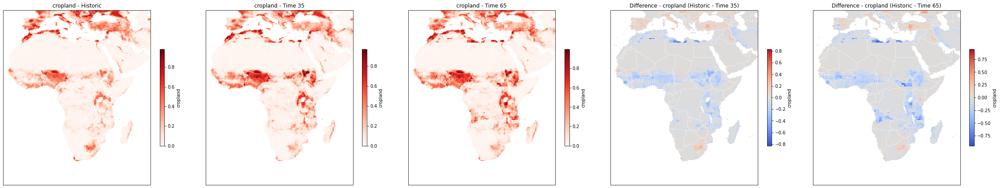

/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


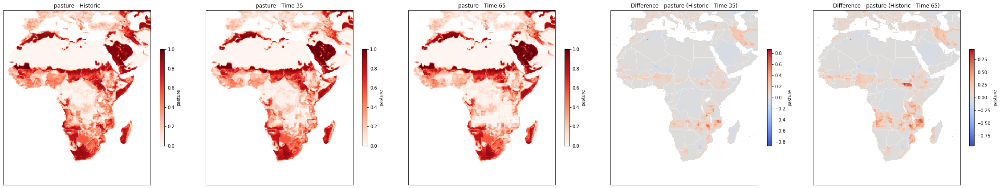

/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


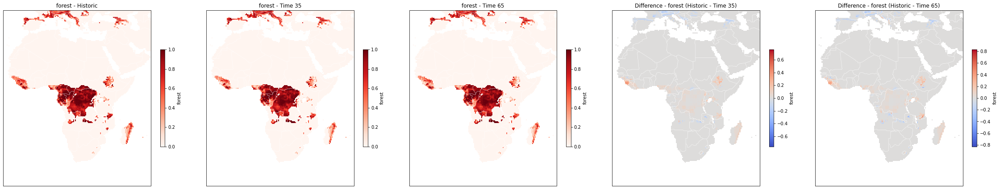

/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


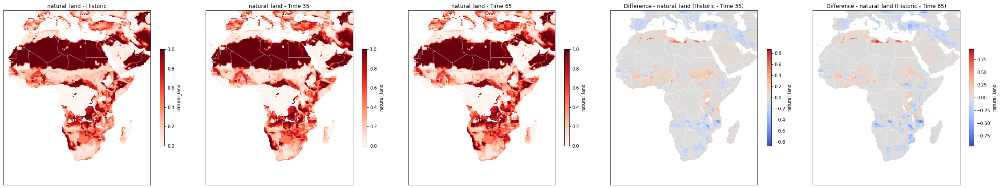

In [97]:
import matplotlib.pyplot as plt
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Future LUH2
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"
ncfname = LandUseList
da_landuse = xr.open_dataset(ncfname, decode_times=False)
da_landuse = da_landuse.isel(time=[35, 65])

LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"
da_historic = xr.open_dataset(LUH_historic, decode_times=False)
da_historic = da_historic.isel(time=1146)

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create a new dataset for sum over categories
sum_over_categories = xr.Dataset()

# Sum the categories for both datasets
for category, vars_in_category in category_mapping.items():
    sum_over_categories[category] = sum(da_landuse[var] for var in vars_in_category)
    da_historic[category] = sum(da_historic[var] for var in vars_in_category)

# Time points for future dataset
time_points = [35, 65]

# Plot each category on a lon-lat map
for category in sum_over_categories.data_vars:
    fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(40, 8), subplot_kw={'projection': ccrs.PlateCarree()})

    # Plot the historic data in the first column
    ax = axes[0]
    im = da_historic[category].plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='Reds', cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"{category} - Historic")
    ax.set_extent((-20, 60, -40, 40))

    # Plot future data for each selected time point in the second and third columns
    for i, time in enumerate(time_points):
        ax = axes[i+1]
        im = sum_over_categories[category].isel(time=i).plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='Reds', cbar_kwargs={'shrink': 0.5})
        ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
        ax.set_title(f"{category} - Time {time}")
        ax.set_extent((-20, 60, -40, 40))

    # Plot the difference between historic and year 35 in the fourth column
    ax = axes[-2]
    diff_35 = da_historic[category] - sum_over_categories[category].sel(time=35)
    im = diff_35.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='coolwarm', cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"Difference - {category} (Historic - Time 35)")
    ax.set_extent((-20, 60, -40, 40))

    # Plot the difference between historic and year 65 in the fifth column
    ax = axes[-1]
    diff_65 = da_historic[category] - sum_over_categories[category].sel(time=65)
    im = diff_65.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='coolwarm', cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"Difference - {category} (Historic - Time 65)")
    ax.set_extent((-20, 60, -40, 40))

    # Adjust spacing between subplots
    plt.subplots_adjust(wspace=0.1)

    # Show the plot
    plt.show()


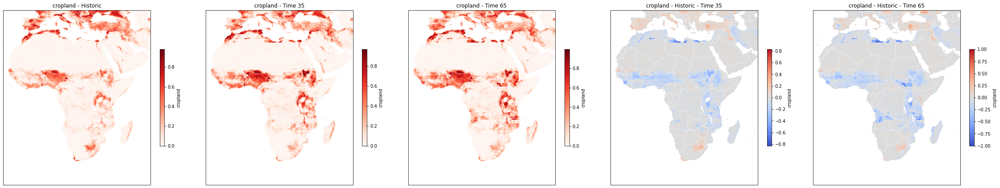

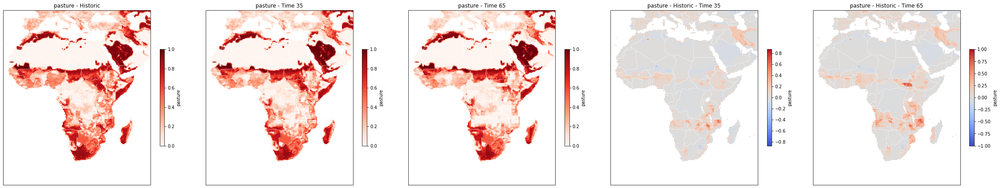

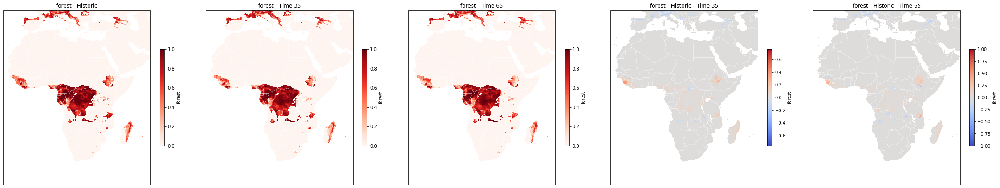

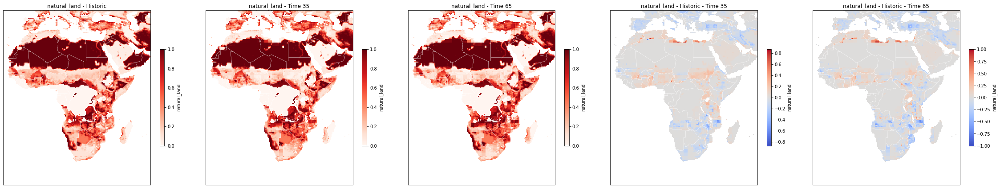

In [57]:
import matplotlib.pyplot as plt
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import warnings

warnings.filterwarnings('ignore', category=UserWarning)

# Future LUH2
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"
ncfname = LandUseList
da_landuse = xr.open_dataset(ncfname, decode_times=False)
da_landuse = da_landuse.isel(time=[35, 65])

LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"
da_historic = xr.open_dataset(LUH_historic, decode_times=False)
da_historic = da_historic.isel(time=1146)

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create a new dataset for sum over categories
sum_over_categories = xr.Dataset()

# Sum the categories for both datasets
for category, vars_in_category in category_mapping.items():
    sum_over_categories[category] = sum(da_landuse[var] for var in vars_in_category)
    da_historic[category] = sum(da_historic[var] for var in vars_in_category)

# Time points for future dataset
time_points = [35, 65]

# Plot each category on a lon-lat map
for category in sum_over_categories.data_vars:
    fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(40, 8), subplot_kw={'projection': ccrs.PlateCarree()})

    # Plot the historic data in the first column
    ax = axes[0]
    im = da_historic[category].plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='Reds', cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"{category} - Historic")
    ax.set_extent((-20, 60, -40, 40))

    # Plot future data for each selected time point in the second and third columns
    for i, time in enumerate(time_points):
        ax = axes[i+1]
        im = sum_over_categories[category].isel(time=i).plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='Reds', cbar_kwargs={'shrink': 0.5})
        ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
        ax.set_title(f"{category} - Time {time}")
        ax.set_extent((-20, 60, -40, 40))

    # Plot the difference between historic and year 35 in the fourth column
    ax = axes[-2]
    diff_35 = da_historic[category] - sum_over_categories[category].sel(time=35)
    im = diff_35.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='coolwarm', cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"{category} - Historic - Time 35")
    ax.set_extent((-20, 60, -40, 40))
    
    # Plot the difference between historic and year 65 in the fifth column
    ax = axes[-1]
    diff_65 = da_historic[category] - sum_over_categories[category].sel(time=65)
    im = diff_65.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='coolwarm', cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"{category} - Historic - Time 65")
    ax.set_extent((-20, 60, -40, 40))
    
    # Set colors for cells that become 0 (green) or were 0 and now have value (purple)
    im.set_cmap('coolwarm')
    im.set_clim(vmin=-1, vmax=1)
    cmap = im.get_cmap()
    cmap.set_over('purple')
    cmap.set_under('green')
    
    # Add colorbar
    #cbar = plt.colorbar(im, ax=axes, orientation='horizontal', pad=0.05, aspect=40)
    #cbar.set_label('Change')
    
    # Adjust spacing between subplots
    plt.subplots_adjust(wspace=0.1)
    fig.savefig("/storage/homefs/ch21o450/figures/Africa_LUC.png")




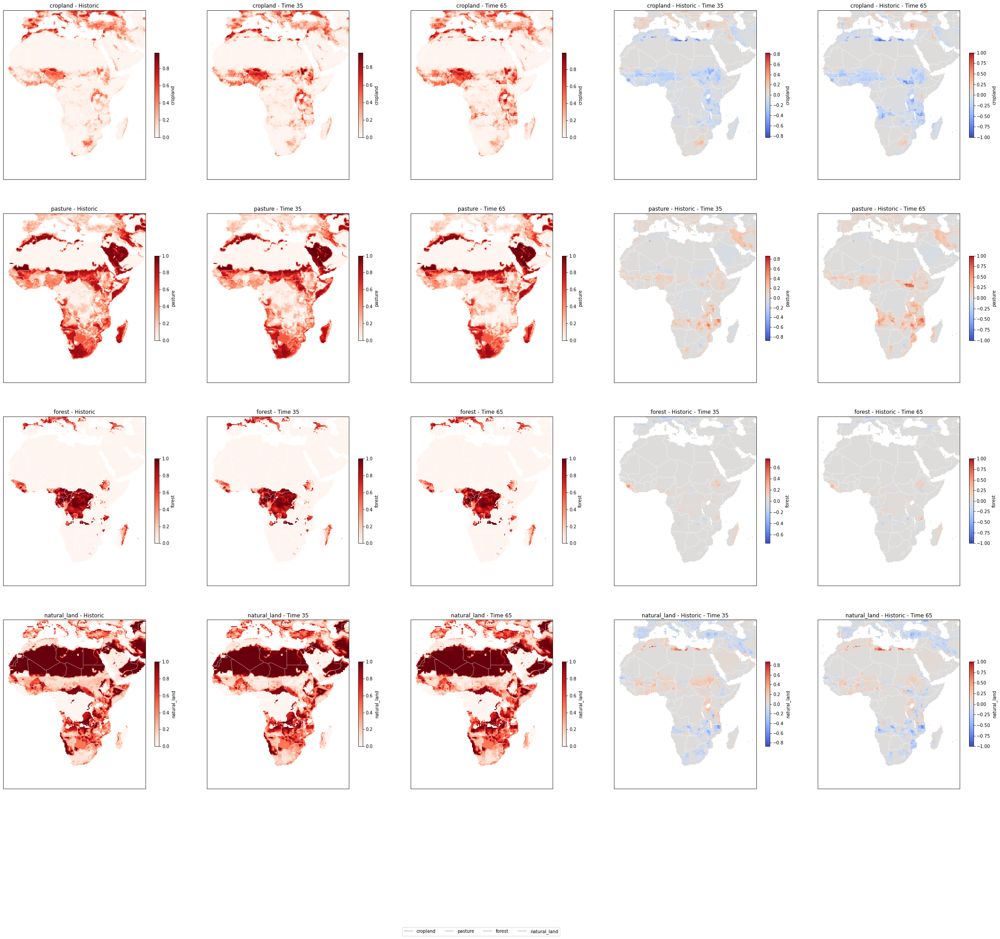

In [58]:
import matplotlib.pyplot as plt
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import warnings

warnings.filterwarnings('ignore', category=UserWarning)

# Future LUH2
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"
ncfname = LandUseList
da_landuse = xr.open_dataset(ncfname, decode_times=False)
da_landuse = da_landuse.isel(time=[35, 65])

LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"
da_historic = xr.open_dataset(LUH_historic, decode_times=False)
da_historic = da_historic.isel(time=1146)

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create a new dataset for sum over categories
sum_over_categories = xr.Dataset()

# Sum the categories for both datasets
for category, vars_in_category in category_mapping.items():
    sum_over_categories[category] = sum(da_landuse[var] for var in vars_in_category)
    da_historic[category] = sum(da_historic[var] for var in vars_in_category)

# Time points for future dataset
time_points = [35, 65]

# Create a new figure and axes
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(40, 32), subplot_kw={'projection': ccrs.PlateCarree()})

# Iterate over the categories to plot
for i, category in enumerate(category_mapping.keys()):
    # Plot the historic data in the first column
    ax = axes[i, 0]
    im = da_historic[category].plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='Reds', cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"{category} - Historic")
    ax.set_extent((-20, 60, -40, 40))

    # Plot future data for each selected time point in the second and third columns
    for j, time in enumerate(time_points):
        ax = axes[i, j+1]
        im = sum_over_categories[category].isel(time=j).plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='Reds', cbar_kwargs={'shrink': 0.5})
        ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
        ax.set_title(f"{category} - Time {time}")
        ax.set_extent((-20, 60, -40, 40))

    # Plot the difference between historic and year 35 in the fourth column
    ax = axes[i, -2]
    diff_35 = da_historic[category] - sum_over_categories[category].sel(time=35)
    im = diff_35.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='coolwarm', cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"{category} - Historic - Time 35")
    ax.set_extent((-20, 60, -40, 40))
    
    # Plot the difference between historic and year 65 in the fifth column
    ax = axes[i, -1]
    diff_65 = da_historic[category] - sum_over_categories[category].sel(time=65)
    im = diff_65.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='coolwarm', cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"{category} - Historic - Time 65")
    ax.set_extent((-20, 60, -40, 40))
    
    # Set colors for cells that become 0 (green) or were 0 and now have value (purple)
    im.set_cmap('coolwarm')
    im.set_clim(vmin=-1, vmax=1)
    cmap = im.get_cmap()
    cmap.set_over('purple')
    cmap.set_under('green')

# Add legend to the figure
fig.legend(labels=category_mapping.keys(), loc='lower center', ncol=5, bbox_to_anchor=(0.5, -0.02))

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.1, hspace=0.2)

# Save the entire figure
fig.savefig("/storage/homefs/ch21o450/figures/Africa_LUC.png")

# Show the plot
plt.show()


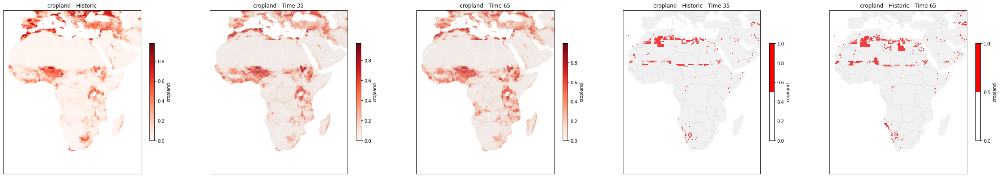

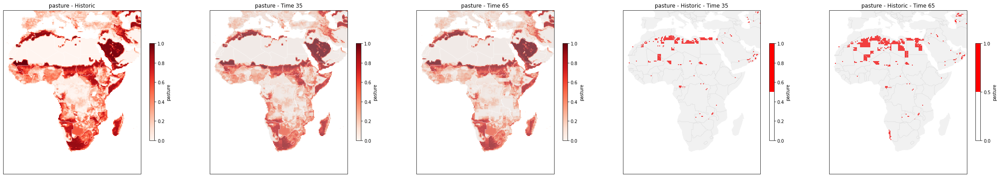

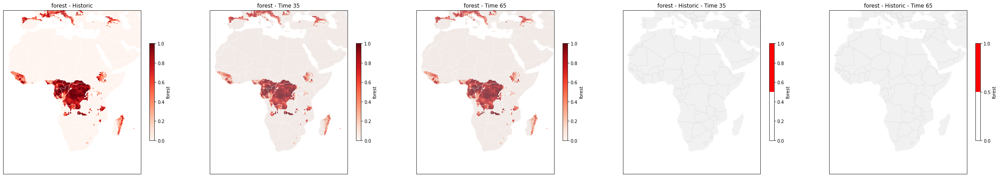

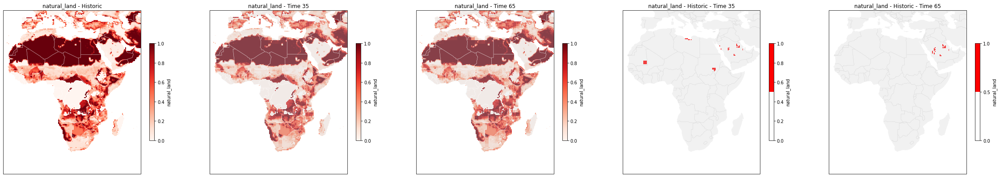

In [14]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
import warnings
import numpy as np

warnings.filterwarnings('ignore', category=UserWarning)
countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))


# Future LUH2
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"
ncfname = LandUseList
da_landuse = xr.open_dataset(ncfname, decode_times=False)
da_landuse = da_landuse.isel(time=[35, 65])

LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"
da_historic = xr.open_dataset(LUH_historic, decode_times=False)
da_historic = da_historic.isel(time=1146)

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create a new dataset for sum over categories
sum_over_categories = xr.Dataset()

# Sum the categories for both datasets
for category, vars_in_category in category_mapping.items():
    sum_over_categories[category] = sum(da_landuse[var] for var in vars_in_category)
    da_historic[category] = sum(da_historic[var] for var in vars_in_category)

# Time points for future dataset
time_points = [35, 65]
cmap_diff = colors.ListedColormap(['white', 'red'])
norm_diff = colors.BoundaryNorm([0, 0.5, 1], cmap_diff.N)
# Plot each category on a lon-lat map
for category in sum_over_categories.data_vars:
    fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(40, 8), subplot_kw={'projection': ccrs.PlateCarree()})

    # Plot the historic data in the first column
    ax = axes[0]
    im = da_historic[category].plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='Reds', cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"{category} - Historic")
    ax.set_extent((-20, 60, -40, 40))

    # Plot future data for each selected time point in the second and third columns
    for i, time in enumerate(time_points):
        ax = axes[i+1]
        im = sum_over_categories[category].isel(time=i).plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='Reds', cbar_kwargs={'shrink': 0.5})
        countries.plot(ax=ax, color="lightgray", zorder=1, alpha=0.3)
        ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
        ax.set_title(f"{category} - Time {time}")
        ax.set_extent((-20, 60, -40, 40))

    # Plot the difference between historic and year 35 in the fourth column
    ax = axes[-2]
    diff_35 = (da_historic[category].astype(bool) ^ sum_over_categories[category].sel(time=35).astype(bool)).astype(float)
    im = diff_35.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap=cmap_diff, cbar_kwargs={'shrink': 0.5}, vmin=0, vmax=1)
    countries.plot(ax=ax, color="lightgray", zorder=1, alpha=0.3)
    ax.add_feature(cfeature.BORDERS, color='lightgrey', linewidth=0.5)
    ax.set_title(f"{category} - Historic - Time 35")
    ax.set_extent((-20, 60, -40, 40))
    
    # Plot the difference between historic and year 65 in the fifth column
    ax = axes[-1]
    diff_65 = (da_historic[category].astype(bool) ^ sum_over_categories[category].sel(time=65).astype(bool)).astype(float)
    countries.plot(ax=ax, color="lightgray", zorder=1, alpha=0.3)
    im = diff_65.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap=cmap_diff, cbar_kwargs={'shrink': 0.5}, vmin=0, vmax=1)
    ax.add_feature(cfeature.BORDERS, color='lightgrey', linewidth=0.5)
    ax.set_title(f"{category} - Historic - Time 65")
    ax.set_extent((-20, 60, -40, 40))

    
    # Set colormap for difference plots: 0 as white, 1 as red+
    cmap_diff = colors.ListedColormap(['white', 'red'])
    norm_diff = colors.BoundaryNorm([0, 0.5, 1], cmap_diff.N)
    
    im.set_cmap(cmap_diff)
    im.set_norm(norm_diff)
    
    # Show the plot
    plt.show()


TypeError: only size-1 arrays can be converted to Python scalars

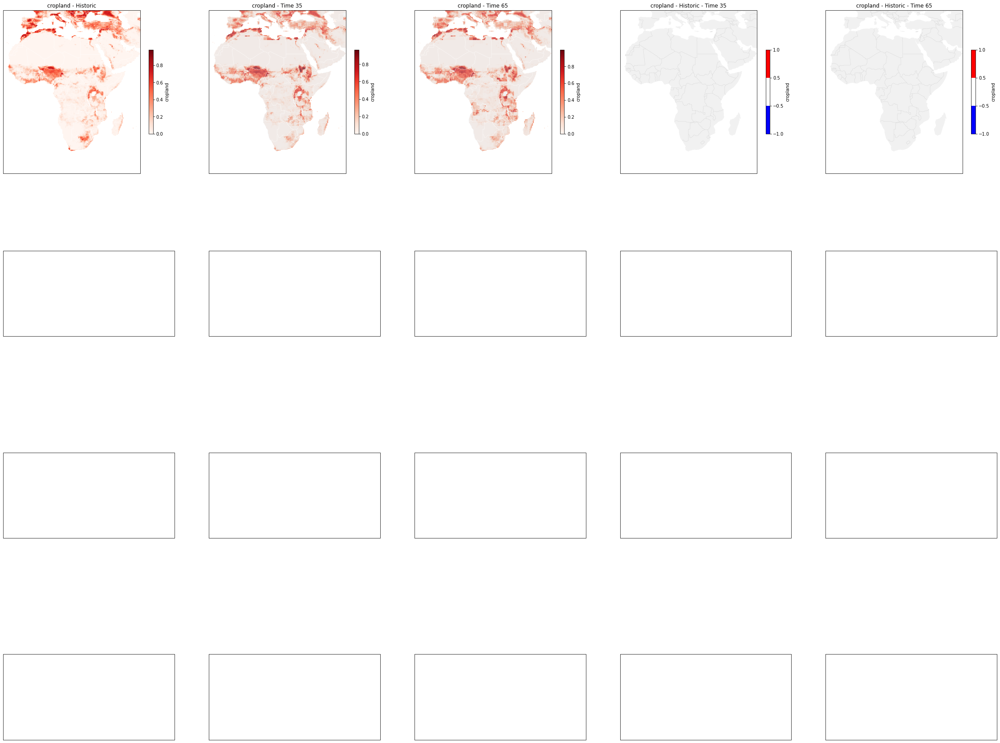

In [16]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
import warnings
import numpy as np

warnings.filterwarnings('ignore', category=UserWarning)
countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

# Future LUH2
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"
ncfname = LandUseList
da_landuse = xr.open_dataset(ncfname, decode_times=False)
da_landuse = da_landuse.isel(time=[35, 65])

LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"
da_historic = xr.open_dataset(LUH_historic, decode_times=False)
da_historic = da_historic.isel(time=1146)

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create a new dataset for sum over categories
sum_over_categories = xr.Dataset()

# Sum the categories for both datasets
for category, vars_in_category in category_mapping.items():
    sum_over_categories[category] = sum(da_landuse[var] for var in vars_in_category)
    da_historic[category] = sum(da_historic[var] for var in vars_in_category)

# Time points for future dataset
time_points = [35, 65]

# Create a new figure and axes
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(40, 32), subplot_kw={'projection': ccrs.PlateCarree()})

# Create a colormap and norm for gains (red) and losses (blue)
cmap_diff = colors.ListedColormap(['blue', 'white', 'red'])
norm_diff = colors.BoundaryNorm([-1, -0.5, 0.5, 1], cmap_diff.N)

# Plot each category on a lon-lat map
for i, category in enumerate(category_mapping.keys()):
    # Plot the historic data in the first column
    ax = axes[i, 0]
    im = da_historic[category].plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='Reds', cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"{category} - Historic")
    ax.set_extent((-20, 60, -40, 40))

    # Plot future data for each selected time point in the second and third columns
    for j, time in enumerate(time_points):
        ax = axes[i, j+1]
        im = sum_over_categories[category].isel(time=j).plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='Reds', cbar_kwargs={'shrink': 0.5})
        countries.plot(ax=ax, color="lightgray", zorder=1, alpha=0.3)
        ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
        ax.set_title(f"{category} - Time {time}")
        ax.set_extent((-20, 60, -40, 40))

    # Plot the difference between historic and year 35 in the fourth column
    ax = axes[i, -2]
    diff_35 = (da_historic[category].astype(bool) ^ sum_over_categories[category].sel(time=35).astype(bool)).astype(float)
    im = diff_35.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap=cmap_diff, cbar_kwargs={'shrink': 0.5}, vmin=-1, vmax=1, norm=norm_diff)
    countries.plot(ax=ax, color="lightgray", zorder=1, alpha=0.3)
    ax.add_feature(cfeature.BORDERS, color='lightgrey', linewidth=0.5)
    ax.set_title(f"{category} - Historic - Time 35")
    ax.set_extent((-20, 60, -40, 40))
    
    # Plot the difference between historic and year 65 in the fifth column
    ax = axes[i, -1]
    diff_65 = (da_historic[category].astype(bool) ^ sum_over_categories[category].sel(time=65).astype(bool)).astype(float)
    im = diff_65.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap=cmap_diff, cbar_kwargs={'shrink': 0.5}, vmin=-1, vmax=1, norm=norm_diff)
    countries.plot(ax=ax, color="lightgray", zorder=1, alpha=0.3)
    ax.add_feature(cfeature.BORDERS, color='lightgrey', linewidth=0.5)
    ax.set_title(f"{category} - Historic - Time 65")
    ax.set_extent((-20, 60, -40, 40))
    
    # Add annotations for grid cell values
    for ax_sub in [axes[i, -2], axes[i, -1]]:
        for x, y, val in zip(da_historic.lon, da_historic.lat, diff_35 if ax_sub is axes[i, -2] else diff_65):
            ax_sub.annotate(str(int(val)), xy=(x, y), xytext=(3, 3), textcoords="offset points", fontsize=8)

# Add legend to the figure
fig.legend(labels=category_mapping.keys(), loc='lower center', ncol=5, bbox_to_anchor=(0.5, -0.02))

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.1, hspace=0.2)

# Save the entire figure
fig.savefig("/storage/homefs/ch21o450/figures/Africa_LUC_boolean.png")

# Show the plot
plt.show()


/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


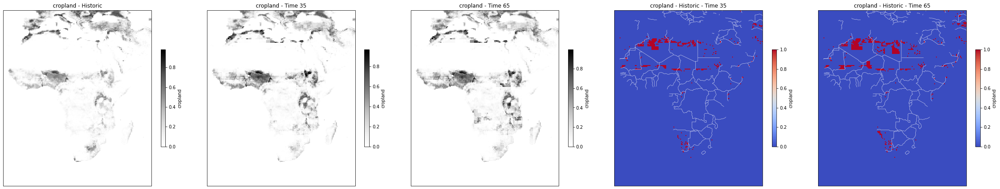

/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


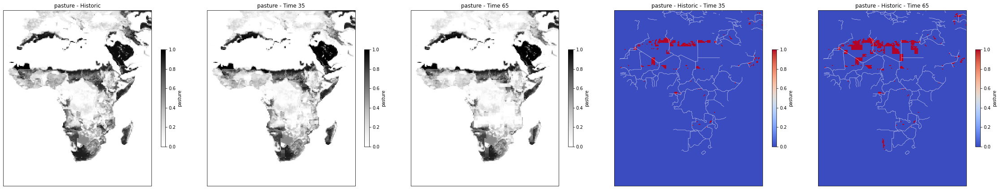

/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


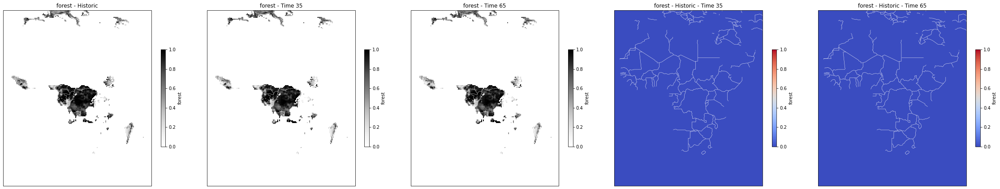

/storage/homefs/ch21o450/.local/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


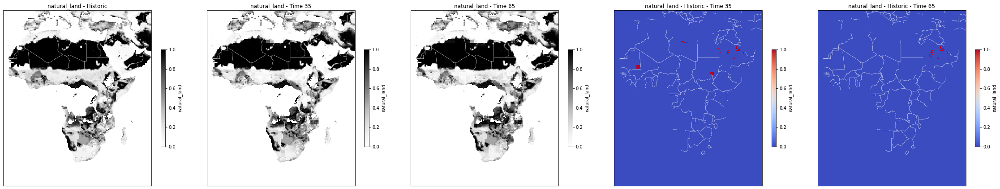

In [107]:
import matplotlib.pyplot as plt
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Future LUH2
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"
ncfname = LandUseList
da_landuse = xr.open_dataset(ncfname, decode_times=False)
da_landuse = da_landuse.isel(time=[35, 65])

LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"
da_historic = xr.open_dataset(LUH_historic, decode_times=False)
da_historic = da_historic.isel(time=1146)

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create a new dataset for sum over categories
sum_over_categories = xr.Dataset()

# Sum the categories for both datasets
for category, vars_in_category in category_mapping.items():
    sum_over_categories[category] = sum(da_landuse[var] for var in vars_in_category)
    da_historic[category] = sum(da_historic[var] for var in vars_in_category)

# Time points for future dataset
time_points = [35, 65]

# Plot each category on a lon-lat map
for category in sum_over_categories.data_vars:
    fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(40, 8), subplot_kw={'projection': ccrs.PlateCarree()})

    # Plot the historic data in the first column
    ax = axes[0]
    im = da_historic[category].plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='Greys', cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"{category} - Historic")
    ax.set_extent((-20, 60, -40, 40))

    # Plot future data for each selected time point in the second and third columns
    for i, time in enumerate(time_points):
        ax = axes[i+1]
        im = sum_over_categories[category].isel(time=i).plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='Greys', cbar_kwargs={'shrink': 0.5})
        ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
        ax.set_title(f"{category} - Time {time}")
        ax.set_extent((-20, 60, -40, 40))

    # Plot the difference between historic and year 35 in the fourth column
    ax = axes[-2]
    diff_35 = da_historic[category].astype(bool) ^ sum_over_categories[category].sel(time=35).astype(bool)
    im = diff_35.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='coolwarm', cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"{category} - Historic - Time 35")
    ax.set_extent((-20, 60, -40, 40))
    
    # Plot the difference between historic and year 65 in the fifth column
    ax = axes[-1]
    diff_65 = da_historic[category].astype(bool) ^ sum_over_categories[category].sel(time=65).astype(bool)
    im = diff_65.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), ax=ax, cmap='coolwarm', cbar_kwargs={'shrink': 0.5})
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
    ax.set_title(f"{category} - Historic - Time 65")
    ax.set_extent((-20, 60, -40, 40))
    
    # Set colors for cells that become 0 (green) or were 0 and now have value (purple)
    cmap = im.get_cmap()
    cmap.set_over('purple')
    cmap.set_under('green')
    
    # Add colorbar
    #cbar = plt.colorbar(im, ax=axes, orientation='horizontal', pad=0.05, aspect=40)
    #cbar.set_label('Change')
    
    # Adjust spacing between subplots
    plt.subplots_adjust(wspace=0.1)
    
    # Show the plot
    plt.show()


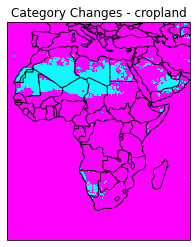

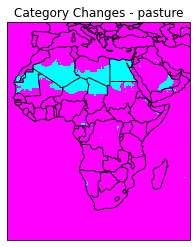

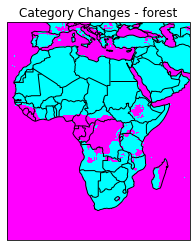

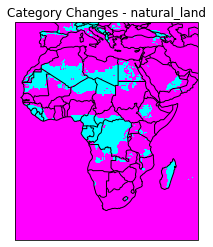

The category that has lost the most grid cells is: <xarray.Dataset>
Dimensions:       ()
Data variables:
    cropland      float64 0.0
    pasture       float64 0.0
    forest        float64 50.0
    natural_land  float64 0.0
The category that has gained the most grid cells is: <xarray.Dataset>
Dimensions:       ()
Data variables:
    cropland      float64 82.0
    pasture       float64 76.0
    forest        float64 0.0
    natural_land  float64 76.0


In [66]:
import matplotlib.pyplot as plt
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Future LUH2
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"
ncfname = LandUseList
ds_landuse = xr.open_dataset(ncfname, decode_times=False)

# Historic LUH2
LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"
ds_historic = xr.open_dataset(LUH_historic, decode_times=False)

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create separate datasets for each category in the future and historic datasets
da_landuse = xr.Dataset()
da_historic = xr.Dataset()

for category, vars_in_category in category_mapping.items():
    da_landuse[category] = sum(ds_landuse[var] for var in vars_in_category)
    da_historic[category] = sum(ds_historic[var] for var in vars_in_category)

# Compare the categories for each grid cell between the future and historic datasets
category_changes = (da_landuse != da_historic).astype(int)

# Plot the grid cells where the category changes on a map
for category in category_mapping.keys():
    fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
    ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())
    ax.set_extent((-20, 60, -40, 40))

    # Select a specific time point to plot the category changes
    time_point = 0

    # Plot the grid cells where the category changes
    category_changes[category].isel(time=time_point).plot.imshow(ax=ax, cmap='cool', add_colorbar=False)

    # Add coastlines and borders
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS)

    # Set title
    ax.set_title(f"Category Changes - {category}")

    # Show the plot
    plt.show()

# Calculate the number of grid cells per category for the future and historic datasets
num_cells_landuse = da_landuse.astype(bool).sum(dim=['lat', 'lon'])
num_cells_historic = da_historic.astype(bool).sum(dim=['lat', 'lon'])

# Determine the category that has lost the most grid cells
lost_category = num_cells_historic - num_cells_landuse
most_cells_lost_category = lost_category.idxmax()

# Determine the category that has gained the most grid cells
gained_category = num_cells_landuse - num_cells_historic
most_cells_gained_category = gained_category.idxmax()


# Print the summary statistics
print(f"The category that has lost the most grid cells is: {most_cells_lost_category}")
print(f"The category that has gained the most grid cells is: {most_cells_gained_category}")


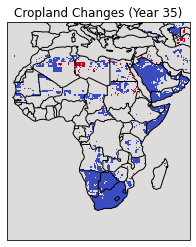

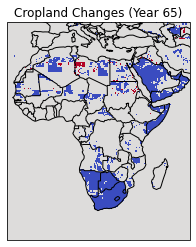

In [84]:
import matplotlib.pyplot as plt
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

# Future LUH2
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"
ncfname = LandUseList
ds_landuse = xr.open_dataset(ncfname, decode_times=False)

# Historic LUH2
LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"
ds_historic = xr.open_dataset(LUH_historic, decode_times=False)

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
}

# Create a dataset for cropland in the future and historic datasets
da_landuse_cropland = xr.Dataset()
da_historic_cropland = xr.Dataset()

for category, vars_in_category in category_mapping.items():
    da_landuse_cropland[category] = xr.concat([ds_landuse[var] for var in vars_in_category], dim='category').any(dim='category').astype(bool)
    da_historic_cropland[category] = xr.concat([ds_historic[var] for var in vars_in_category], dim='category').any(dim='category').astype(bool)
# Compare cropland for each grid cell between the future and historic datasets

cropland_changes = xr.where((da_landuse_cropland['cropland'] == False) & (da_historic_cropland['cropland'] == True), 1,  # Red for cropland gain
                            xr.where((da_landuse_cropland['cropland'] == True) & (da_historic_cropland['cropland'] == False), -1,  # Blue for cropland loss
                                     0))  # No change


# Plot the grid cells where cropland is lost in year 35 compared to historic
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())
ax.set_extent((-20, 60, -40, 40))

cropland_changes.sel(time=35).plot.imshow(ax=ax, cmap='coolwarm', add_colorbar=False)

ax.coastlines()
ax.add_feature(cfeature.BORDERS)

ax.set_title('Cropland Changes (Year 35)')

plt.show()

# Plot the grid cells where cropland is lost in year 65 compared to historic
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())
ax.set_extent((-20, 60, -40, 40))

cropland_changes.sel(time=65).plot.imshow(ax=ax, cmap='coolwarm', add_colorbar=False)

ax.coastlines()
ax.add_feature(cfeature.BORDERS)

ax.set_title('Cropland Changes (Year 65)')

plt.show()


/scratch/local/58598962/ipykernel_29632/1146339290.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('Greys')


ValueError: A 3-dimensional array was passed to imshow(), but there is no dimension that could be color.  At least one dimension must be of size 3 (RGB) or 4 (RGBA), and not given as x or y.

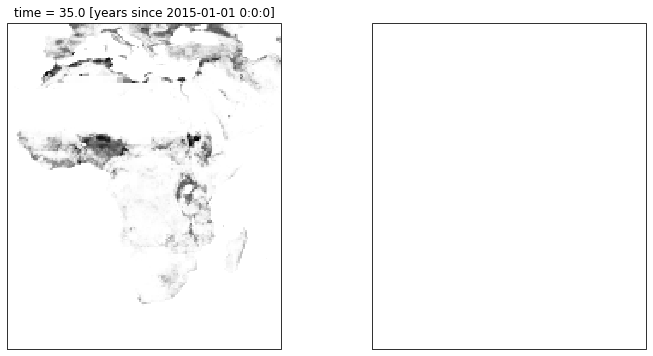

In [81]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

# Create a mask for cropland loss in year 35
cropland_loss_35 = (da_landuse['cropland'].isel(time=35) == 0) & (da_historic['cropland'] > 0)

# Create a mask for cropland loss in year 65
cropland_loss_65 = (da_landuse['cropland'].isel(time=65) == 0) & (da_historic['cropland'] > 0)

# Create a colormap for cropland loss
cmap = plt.cm.get_cmap('Greys')
cmap.set_bad('white')

# Plot the grid cells
fig, (ax1, ax2) = plt.subplots(ncols=2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(12, 6))
ax1.set_extent((-180, 180, -90, 90), crs=ccrs.PlateCarree())
ax1.set_extent((-20, 60, -40, 40))
ax2.set_extent((-180, 180, -90, 90), crs=ccrs.PlateCarree())
ax2.set_extent((-20, 60, -40, 40))

# Plot cropland loss in year 35
da_landuse['cropland'].isel(time=35).plot.imshow(ax=ax1, cmap=cmap, add_colorbar=False)
cropland_loss_35.plot.imshow(ax=ax1, cmap=cmap, alpha=0.5, add_colorbar=False)
ax1.set_title("Cropland Loss - Year 35")

# Plot cropland loss in year 65
da_landuse['cropland'].isel(time=65).plot.imshow(ax=ax2, cmap=cmap, add_colorbar=False)
cropland_loss_65.plot.imshow(ax=ax2, cmap=cmap, alpha=0.5, add_colorbar=False)
ax2.set_title("Cropland Loss - Year 65")

# Add coastlines and borders
for ax in [ax1, ax2]:
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS)

# Show the plot
plt.tight_layout()
plt.show()


In [59]:
import matplotlib.pyplot as plt
import xarray as xr

# Future LUH2
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"
ncfname = LandUseList
ds_landuse = xr.open_dataset(ncfname, decode_times=False)

# Historic LUH2
LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"
ds_historic = xr.open_dataset(LUH_historic, decode_times=False)

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create separate datasets for each category in the future and historic datasets
da_landuse = xr.Dataset()
da_historic = xr.Dataset()

for category, vars_in_category in category_mapping.items():
    da_landuse[category] = sum(ds_landuse[var] for var in vars_in_category)
    da_historic[category] = sum(ds_historic[var] for var in vars_in_category)

# Compare the categories for each grid cell between the future and historic datasets
category_changes = xr.Dataset()
for category in category_mapping.keys():
    category_changes[category] = (da_landuse[category] != da_historic[category]).astype(int)

# Calculate the statistic: count of category changes
category_change_counts = category_changes.stack(grid_cell=('lat', 'lon')).value_counts().to_dataframe(name='count')

# Display the statistic
print(category_change_counts)


AttributeError: 'Dataset' object has no attribute 'value_counts'

In [57]:
import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np

# Future LUH2
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"
ncfname = LandUseList
ds_landuse = xr.open_dataset(ncfname, decode_times=False)

# Historic LUH2
LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"
ds_historic = xr.open_dataset(LUH_historic, decode_times=False)

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create separate datasets for each category in the future and historic datasets
da_landuse = xr.Dataset()
da_historic = xr.Dataset()

for category, vars_in_category in category_mapping.items():
    da_landuse[category] = sum(ds_landuse[var] for var in vars_in_category)
    da_historic[category] = sum(ds_historic[var] for var in vars_in_category)

# Compare the categories for each grid cell between the future and historic datasets
category_changes = xr.Dataset()
for category in category_mapping.keys():
    category_changes[category] = (da_landuse[category] != da_historic[category]).astype(int)

# Calculate the mode along the time dimension to determine the most frequent category change
category_mode = category_changes.mode(dim='time')

# Plot the grid cells where the category changes from the past to the future on a map
for category in category_mapping.keys():
    fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
    ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())

    # Plot the grid cells where the category changes
    category_changes[category].plot.imshow(ax=ax, cmap='cool', add_colorbar=False)

    # Add coastlines and borders
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS)

    # Set title
    ax.set_title(f"Category Changes - {category}")

    # Show the plot
    plt.show()

# Calculate the counts of category changes
change_counts = category_mode.groupby('stacked_categories').count()

# Print the most frequent category changes
for stacked_category, count in change_counts.items():
    from_category, to_category = stacked_category.split('_to_')
    print(f"Most frequent change: {from_category} to {to_category}, Count: {int(count.values)}")

    

AttributeError: 'Dataset' object has no attribute 'mode'

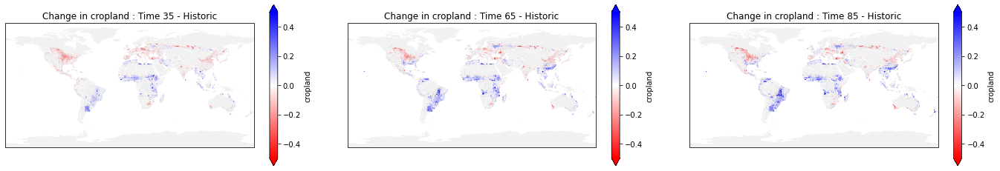

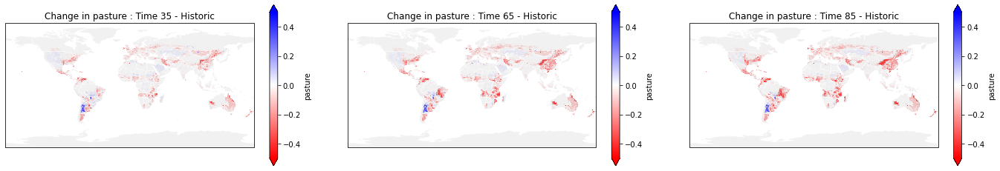

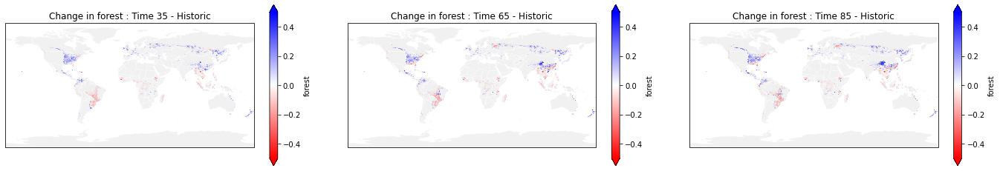

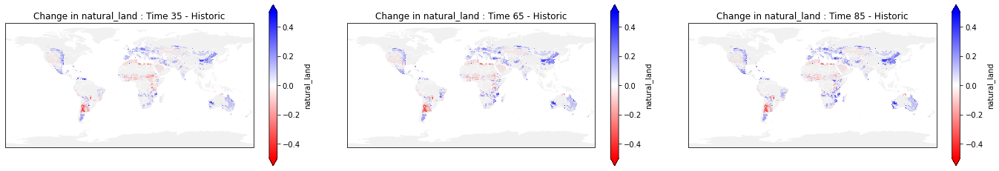

In [7]:
import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import xarray as xr
import warnings

warnings.filterwarnings('ignore', category=UserWarning)
countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

# Future LUH2
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"
ncfname = LandUseList
da_landuse = xr.open_dataset(ncfname, decode_times=False)
da_landuse = da_landuse.isel(time=[35, 65, 85])

LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"
da_historic = xr.open_dataset(LUH_historic, decode_times=False)
da_historic = da_historic.isel(time=1146)

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create a new dataset for sum over categories
sum_over_categories = xr.Dataset()

# Sum the categories for both datasets
for category, vars_in_category in category_mapping.items():
    sum_over_categories[category] = sum(da_landuse[var] for var in vars_in_category)
    da_historic[category] = sum(da_historic[var] for var in vars_in_category)

# Time points for future dataset
time_points = [35, 65, 85]

# Plot each category on a lon-lat map
for category in sum_over_categories.data_vars:
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(24, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    
    # Plot future data for each selected time point in the remaining columns
    for i, time in enumerate(time_points):
        ax = axes[i]
        # Compute the difference between the future and the historical data
        difference = sum_over_categories[category].isel(time=i) - da_historic[category]
        im = difference.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap='bwr_r', ax=ax, vmin=-0.5, vmax=0.5, cbar_kwargs={'shrink': 0.5})
        countries.plot(ax=ax, color="lightgray", zorder=1, alpha=0.3)
        ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
        ax.set_title(f"Change in {category} : Time {time} - Historic")
        #ax.set_extent((-20, 60, -40, 40))
    # Adjust spacing between subplots
    plt.subplots_adjust(wspace=0.1)
    
    # Show the plot
    plt.show()


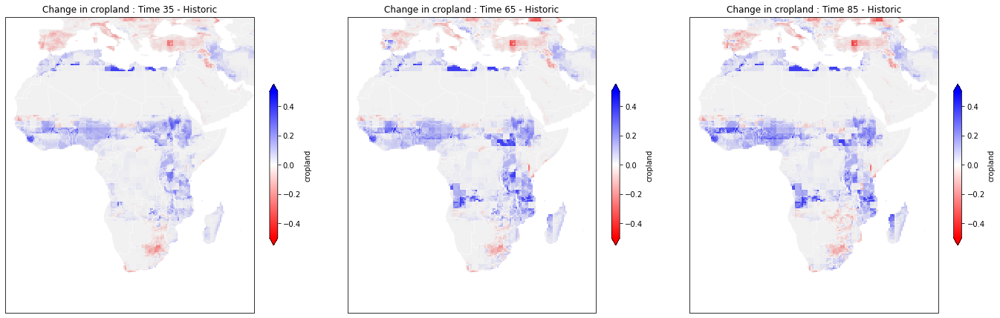

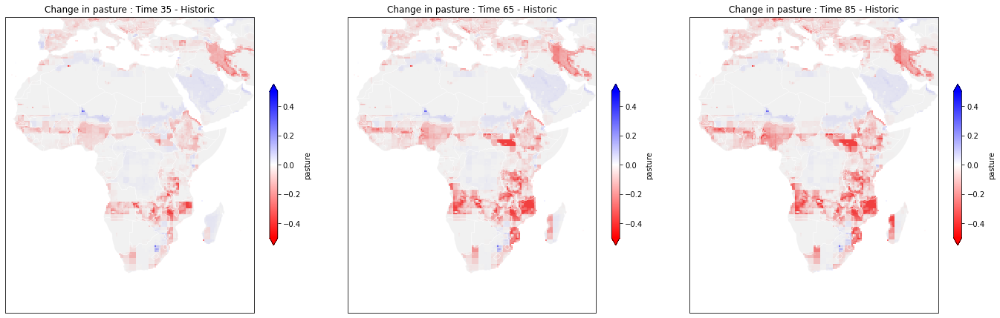

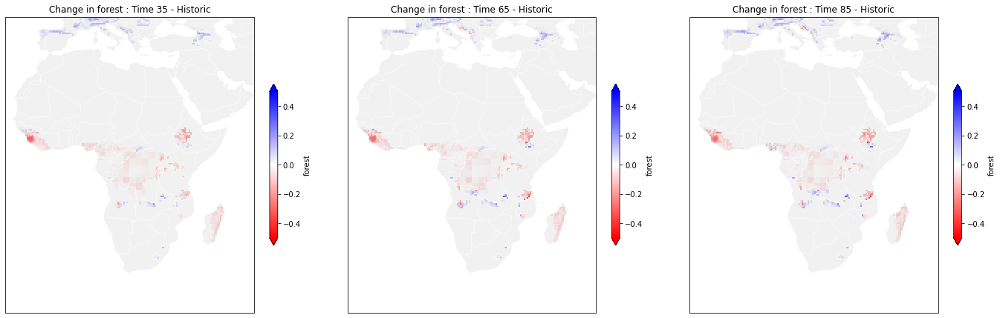

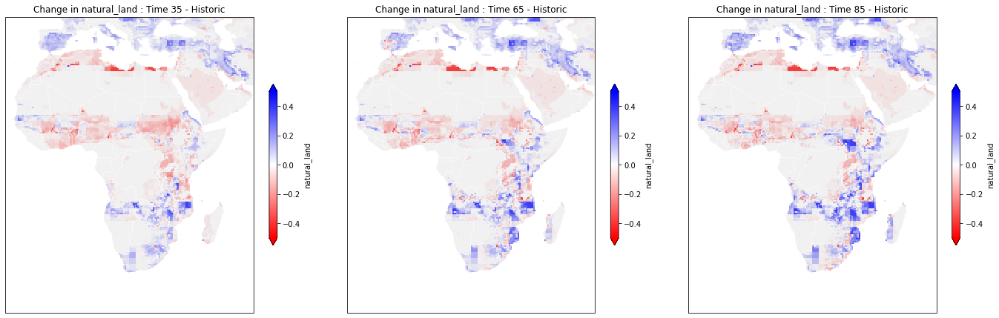

In [6]:
import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import xarray as xr
import warnings

warnings.filterwarnings('ignore', category=UserWarning)
countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

# Future LUH2
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"
ncfname = LandUseList
da_landuse = xr.open_dataset(ncfname, decode_times=False)
da_landuse = da_landuse.isel(time=[35, 65, 85])

LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"
da_historic = xr.open_dataset(LUH_historic, decode_times=False)
da_historic = da_historic.isel(time=1146)

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create a new dataset for sum over categories
sum_over_categories = xr.Dataset()

# Sum the categories for both datasets
for category, vars_in_category in category_mapping.items():
    sum_over_categories[category] = sum(da_landuse[var] for var in vars_in_category)
    da_historic[category] = sum(da_historic[var] for var in vars_in_category)

# Time points for future dataset
time_points = [35, 65, 85]

# Plot each category on a lon-lat map
for category in sum_over_categories.data_vars:
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(24, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    
    # Plot future data for each selected time point in the remaining columns
    for i, time in enumerate(time_points):
        ax = axes[i]
        # Compute the difference between the future and the historical data
        difference = sum_over_categories[category].isel(time=i) - da_historic[category]
        im = difference.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap='bwr_r', ax=ax, vmin=-0.5, vmax=0.5, cbar_kwargs={'shrink': 0.5})
        countries.plot(ax=ax, color="lightgray", zorder=1, alpha=0.3)
        ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
        ax.set_title(f"Change in {category} : Time {time} - Historic")
        ax.set_extent((-20, 60, -40, 40))
    # Adjust spacing between subplots
    plt.subplots_adjust(wspace=0.1)
    
    # Show the plot
    plt.show()


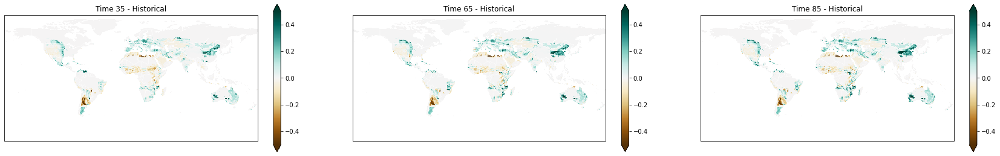

In [14]:
#Africa each variable future - 1995 
warnings.filterwarnings('ignore', category=UserWarning)
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"


ncfname = LandUseList
da_landuse = xr.open_dataset(ncfname, decode_times=False)
da_landuse = da_landuse.isel(time=[35, 65,85])

LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"

da_historic =  xr.open_dataset(LUH_historic, decode_times=False)
da_historic = da_historic.isel(time=1146)

fig, axes = plt.subplots(ncols=3, figsize=(30, 15), subplot_kw={'projection': ccrs.PlateCarree()})

for i, time in enumerate([35, 65, 85]):
    ax = axes[i]
    sum_ps = da_landuse["primn"].isel(time=i) + da_landuse["secdn"].isel(time=i)
    sum_his = da_historic["primn"] + da_historic["secdn"]
    diff = sum_ps - sum_his

    # Plot data
    im = diff.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap='BrBG', ax=ax, vmin=-0.5, vmax=0.5, cbar_kwargs={'shrink': 0.3})

    # Set map extent and add borders
    #ax.set_extent((-20, 60, -40, 40))
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)

    # Title
    ax.set_title(f"Time {time} - Historical")

    # Remove x-axis and y-axis labels
    ax.set_xlabel('')
    ax.set_ylabel('')

    # Remove ticks
    ax.set_xticks([])
    ax.set_yticks([])

    # Remove spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.1)

# Show the plot
plt.show()



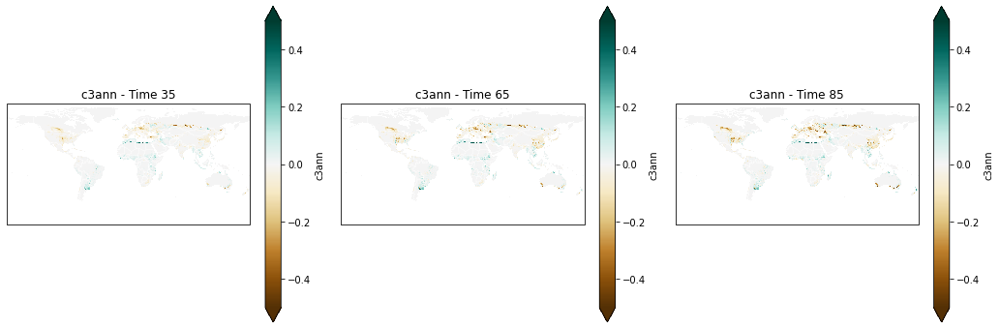

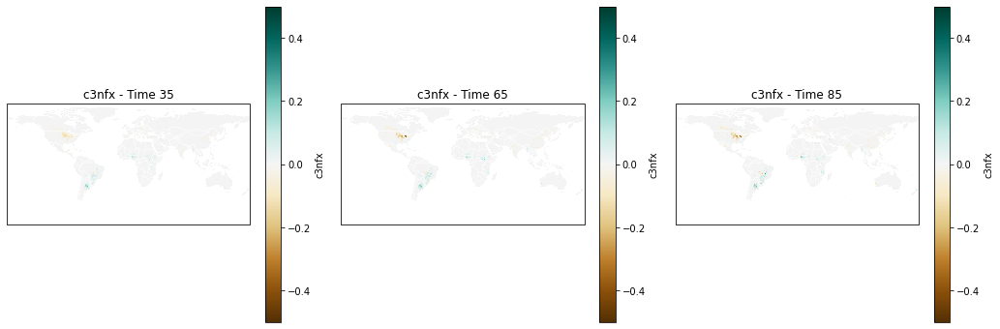

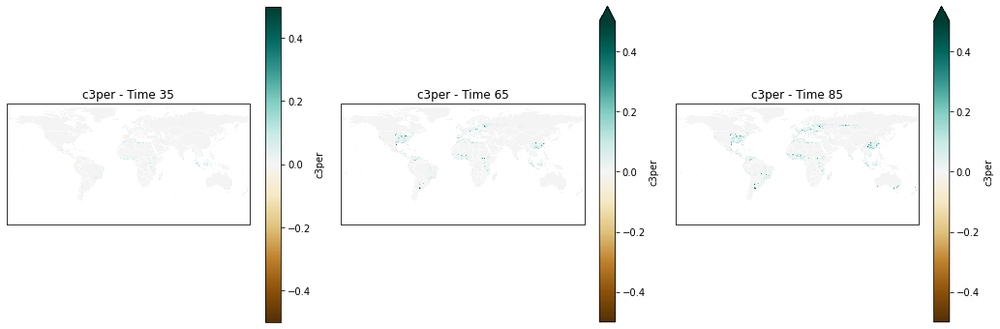

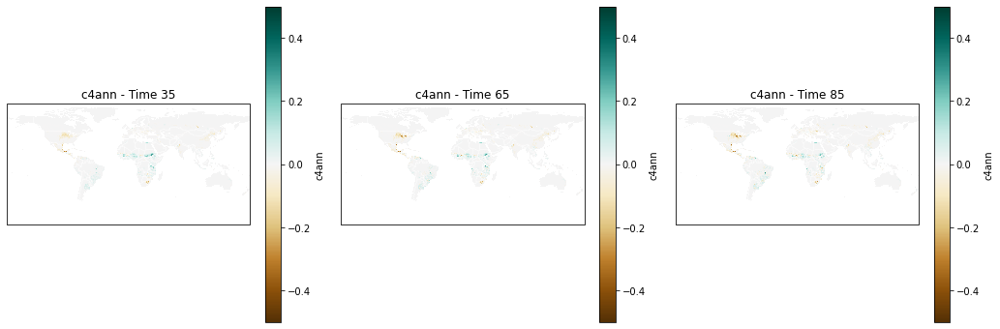

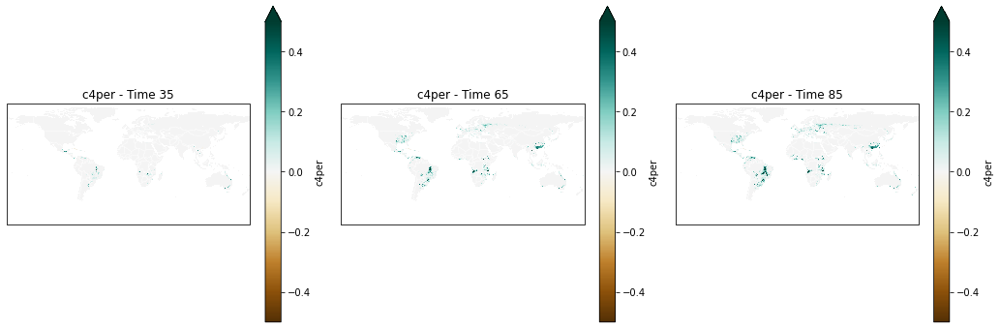

...

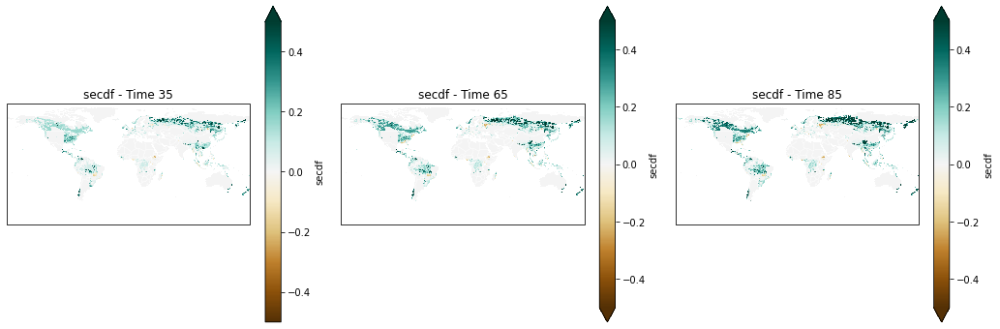

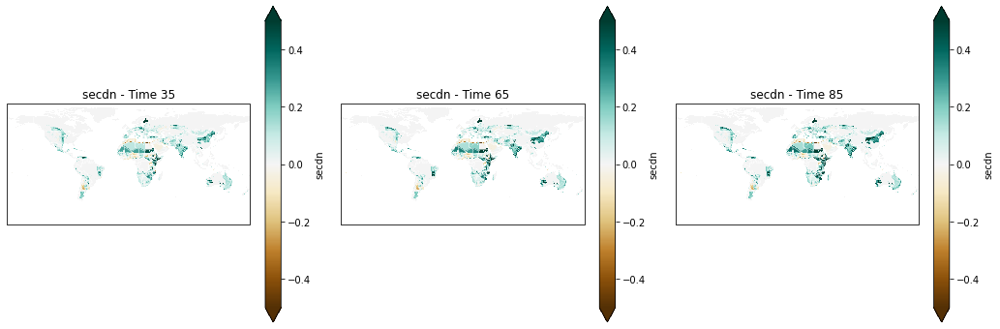

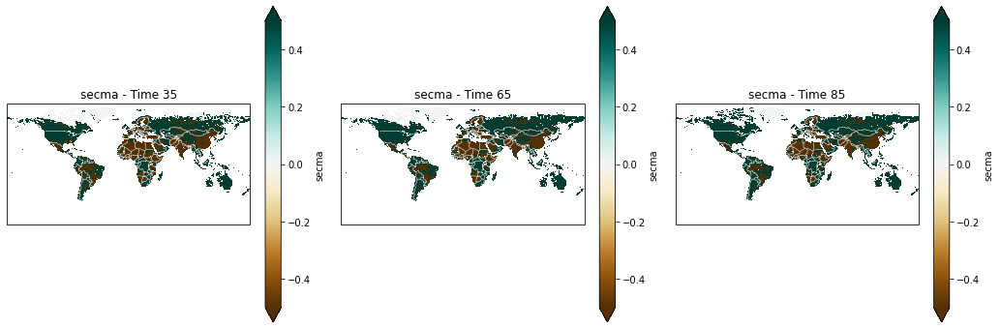

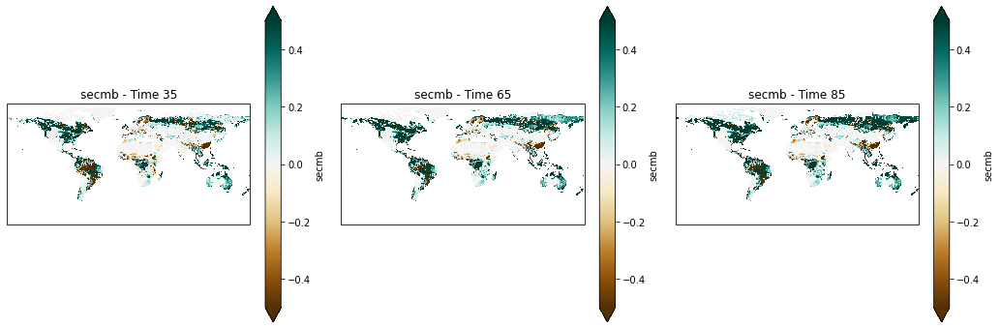

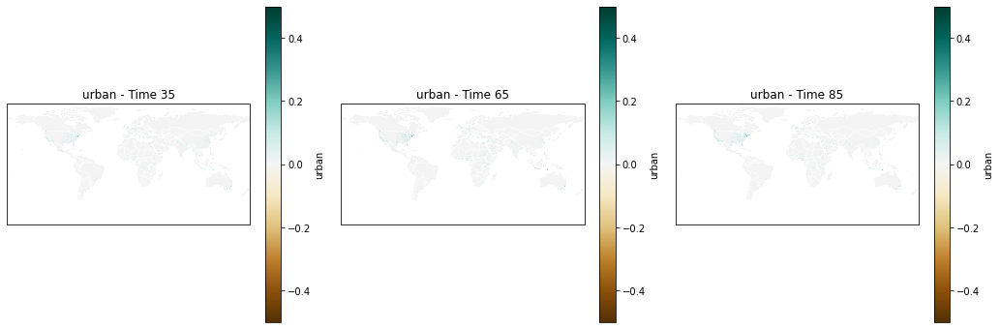

In [25]:
#Africa each variable future - 1995 
warnings.filterwarnings('ignore', category=UserWarning)
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"


ncfname = LandUseList
da_landuse = xr.open_dataset(ncfname, decode_times=False)
da_landuse = da_landuse.isel(time=[35, 65,85])

LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"

da_historic =  xr.open_dataset(LUH_historic, decode_times=False)
da_historic = da_historic.isel(time=1146)

# Create a list of variable names excluding 'time_bnds'
variables = [var for var in da_landuse.data_vars if var != 'time_bnds']

# Plot each variable on a lon-lat map
for var in variables:
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6), subplot_kw={'projection': ccrs.PlateCarree()})
    
    for i, time in enumerate([35, 65, 85]):
        ax = axes[i]
        # Compute the difference between da_landuse and da_historic
        diff = da_landuse[var].isel(time=i) - da_historic[var]
        
        # Plot data
        im = diff.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap='BrBG', ax=ax, vmin=-0.5, vmax=0.5)
        
        # Set map extent and add borders
        #ax.set_extent((-20, 60, -40, 40))
        ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)
        
        # Title
        ax.set_title(f"{var} - Time {time}")
    
    # Colorbar
    
    # Adjust spacing between subplots
    plt.subplots_adjust(wspace=0.1)
    
    # Show the plot
    plt.show()

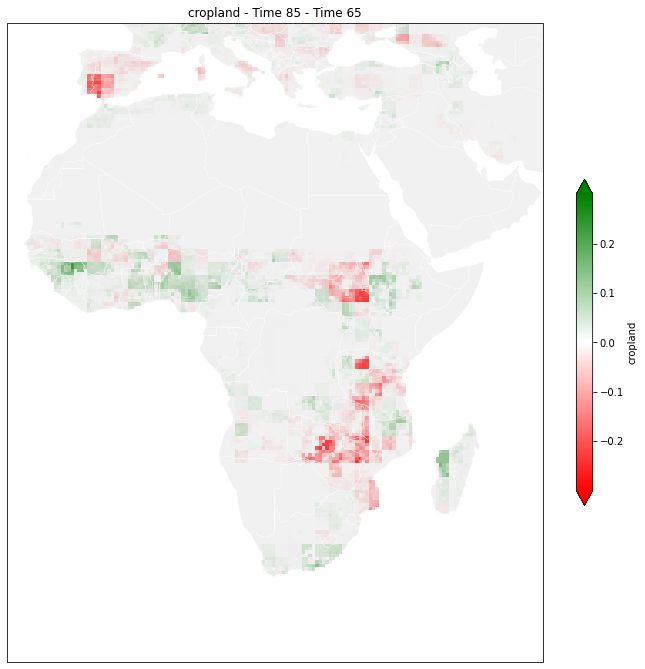

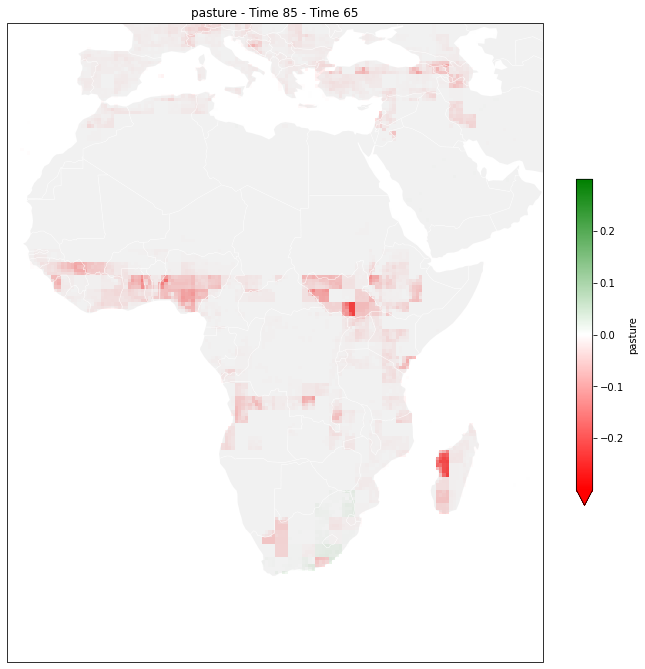

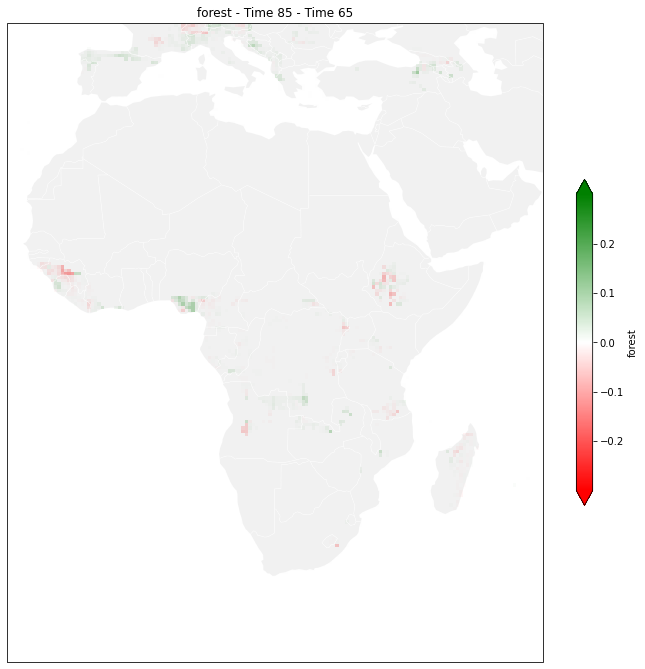

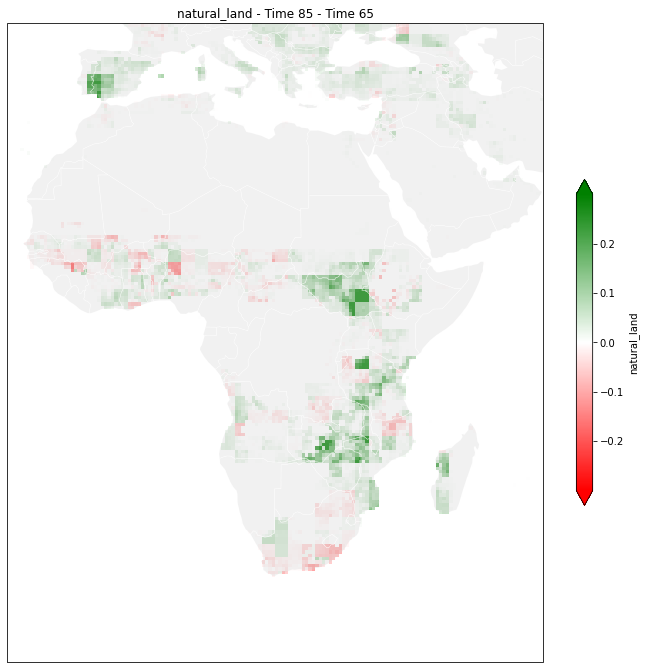

In [22]:
import warnings
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import xarray as xr

warnings.filterwarnings('ignore', category=UserWarning)
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"

ncfname = LandUseList
da_landuse = xr.open_dataset(ncfname, decode_times=False)
da_landuse = da_landuse.isel(time=[35, 65, 85])

LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"

da_historic = xr.open_dataset(LUH_historic, decode_times=False)
da_historic = da_historic.isel(time=1146)

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create a new dataset for sum over categories
sum_over_categories = xr.Dataset()

# Sum the categories for both datasets
for category, vars_in_category in category_mapping.items():
    sum_over_categories[category] = sum(da_landuse[var] for var in vars_in_category)

# Define a colormap with a white midpoint
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["red","white","green"])

# Normalize the colormap so that 0 maps to the midpoint
norm = matplotlib.colors.TwoSlopeNorm(vmin=-0.3, vcenter=0, vmax=0.3)

# Plot the difference between the third and the second column for each category
for category in sum_over_categories.data_vars:
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(12, 12), subplot_kw={'projection': ccrs.PlateCarree()})

    # Compute the difference between the third and the second column
    diff = sum_over_categories[category].isel(time=2) - sum_over_categories[category].isel(time=1)
    countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
    # Plot data
    im = diff.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap=cmap, norm=norm, ax=axes, cbar_kwargs={'shrink': 0.5})
    countries.plot(ax=axes, color="lightgray", zorder=1, alpha=0.3)
    # Set map extent and add borders
    axes.set_extent((-20, 60, -40, 40))
    axes.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)

    # Title
    axes.set_title(f"{category} - Time 85 - Time 65")

    # Show the plot
    plt.show()


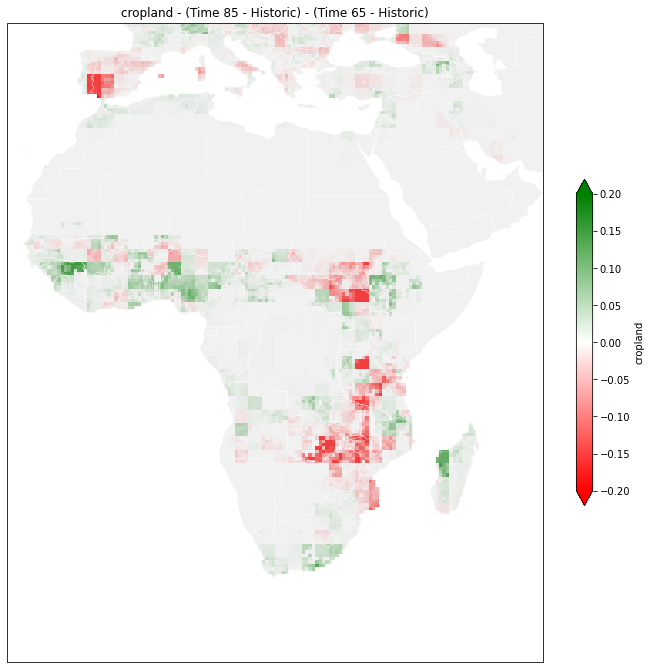

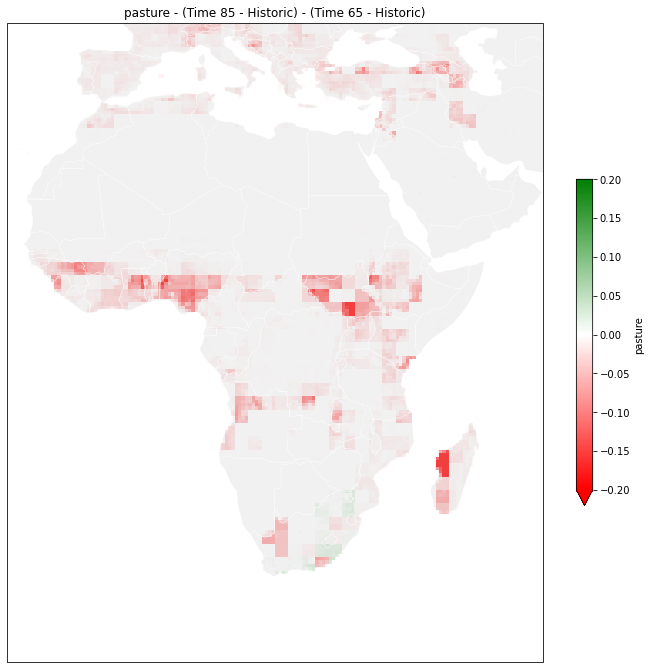

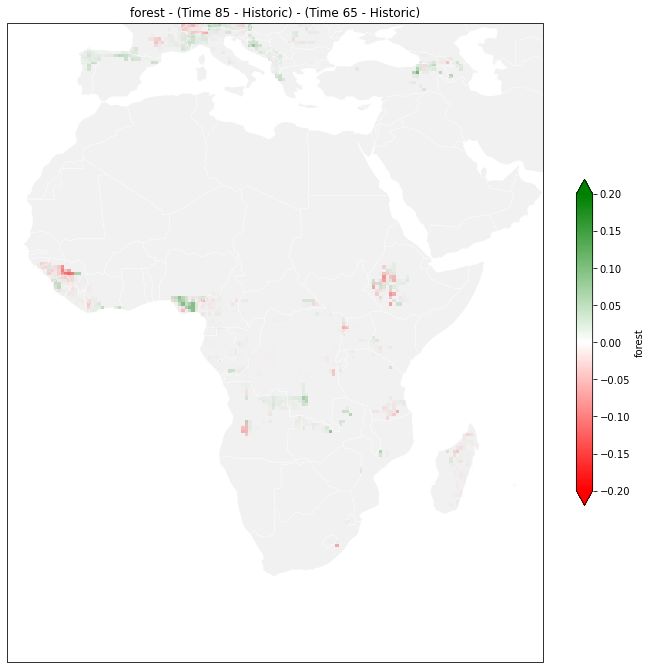

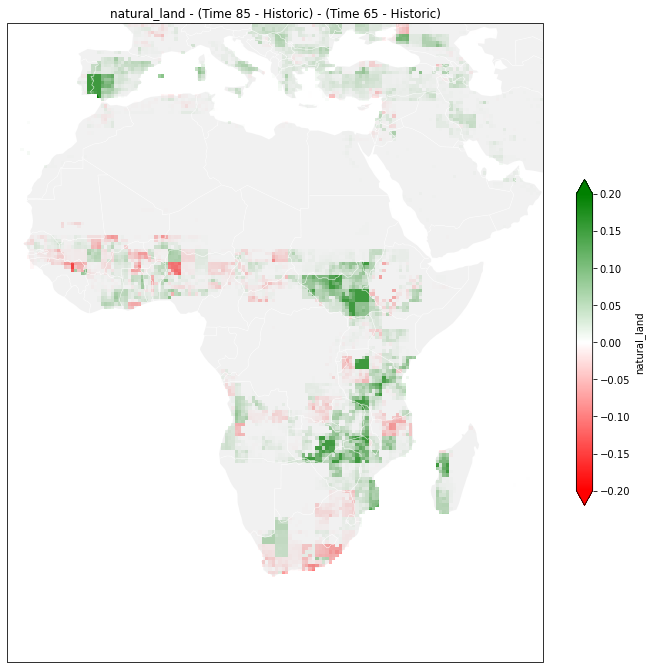

In [30]:
import warnings
import matplotlib.pyplot as plt
import matplotlib
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import xarray as xr

warnings.filterwarnings('ignore', category=UserWarning)
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"

ncfname = LandUseList
da_landuse = xr.open_dataset(ncfname, decode_times=False)
da_landuse = da_landuse.isel(time=[35, 65, 85])

LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"

da_historic = xr.open_dataset(LUH_historic, decode_times=False)
da_historic = da_historic.isel(time=1146)

# Category mapping
category_mapping = {
    'cropland': ['c3ann', 'c3per', 'c4ann', 'c4per', 'c3nfx'],
    'pasture': ['pastr', 'range'],
    'forest': ['primf', 'secdf'],
    'natural_land': ['primn', 'secdn']
}

# Create a new dataset for sum over categories
sum_over_categories_landuse = xr.Dataset()
sum_over_categories_historic = xr.Dataset()

# Sum the categories for both datasets
for category, vars_in_category in category_mapping.items():
    sum_over_categories_landuse[category] = sum(da_landuse[var] for var in vars_in_category)
    sum_over_categories_historic[category] = sum(da_historic[var] for var in vars_in_category)

# Define a colormap with a white midpoint
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["red","white","green"])

# Normalize the colormap so that 0 maps to the midpoint
norm = matplotlib.colors.TwoSlopeNorm(vmin=-0.2, vcenter=0, vmax=0.2)

# Plot (85 - historic) - (65 - historic) for each category
for category in sum_over_categories_landuse.data_vars:
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(12, 12), subplot_kw={'projection': ccrs.PlateCarree()})

    # Compute the difference (85 - historic) - (65 - historic)
    diff = (sum_over_categories_landuse[category].isel(time=2) - sum_over_categories_historic[category]) - (sum_over_categories_landuse[category].isel(time=1) - sum_over_categories_historic[category])
    countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

    # Plot data
    im = diff.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap=cmap, norm=norm, ax=axes, cbar_kwargs={'shrink': 0.5})
   
    countries.plot(ax=axes, color="lightgray", zorder=1, alpha=0.3)
    # Set map extent and add borders
    axes.set_extent((-20, 60, -40, 40))
    axes.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)

    # Title
    axes.set_title(f"{category} - (Time 85 - Historic) - (Time 65 - Historic)")

    # Show the plot
    plt.show


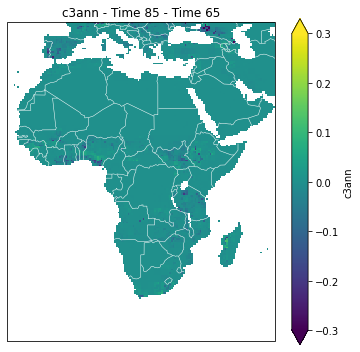

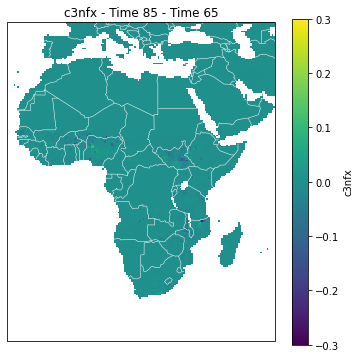

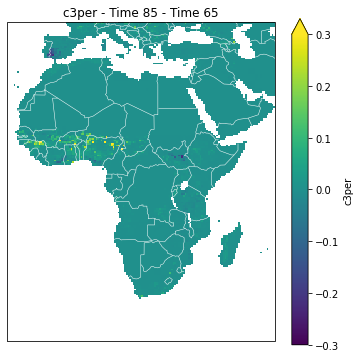

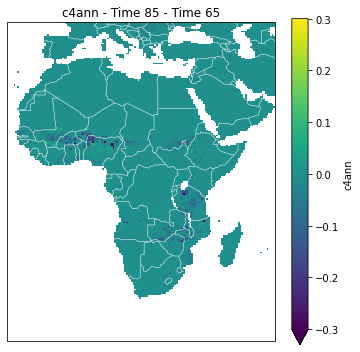

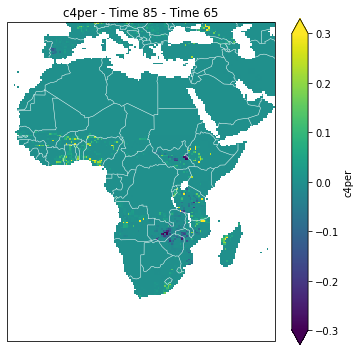

...

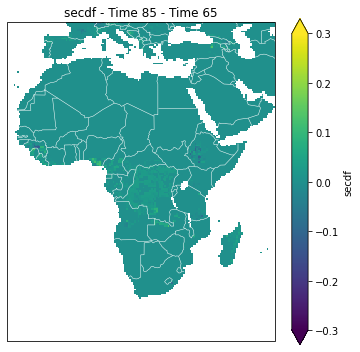

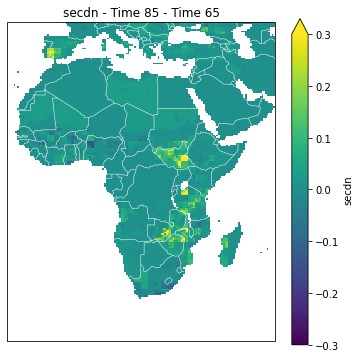

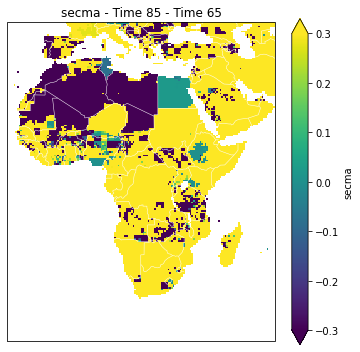

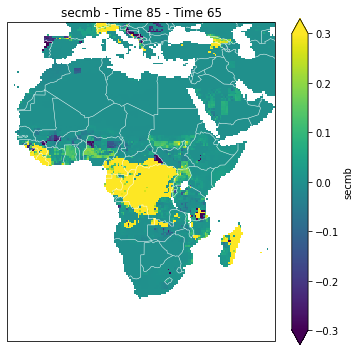

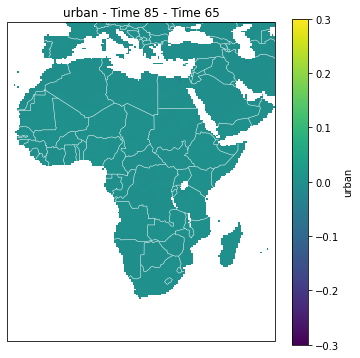

In [16]:
import warnings
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import xarray as xr

warnings.filterwarnings('ignore', category=UserWarning)
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"

ncfname = LandUseList
da_landuse = xr.open_dataset(ncfname, decode_times=False)
da_landuse = da_landuse.isel(time=[35, 65, 85])

LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"

da_historic = xr.open_dataset(LUH_historic, decode_times=False)
da_historic = da_historic.isel(time=1146)

# Create a list of variable names excluding 'time_bnds'
variables = [var for var in da_landuse.data_vars if var != 'time_bnds']

# Plot the difference between the third and the second column for each variable
for var in variables:
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6), subplot_kw={'projection': ccrs.PlateCarree()})

    # Compute the difference between da_landuse and da_historic
    diff = da_landuse[var].isel(time=2) - da_landuse[var].isel(time=1)

    # Plot data
    im = diff.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap='viridis', ax=axes, vmin=-0.3, vmax=0.3)

    # Set map extent and add borders
    axes.set_extent((-20, 60, -40, 40))
    axes.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)

    # Title
    axes.set_title(f"{var} - Time 85 - Time 65")

    # Colorbar
    #cbar = plt.colorbar(im, ax=axes, orientation='horizontal', pad=0.05)
    #cbar.set_label('Difference')

    # Show the plot
    plt.show()


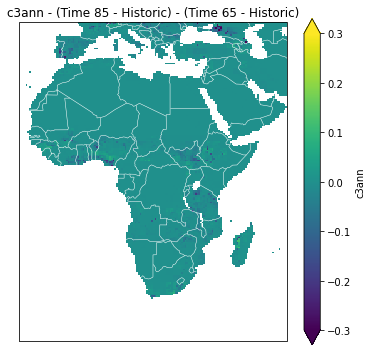

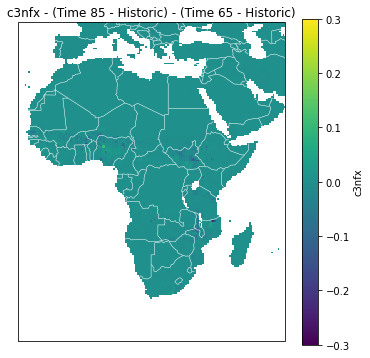

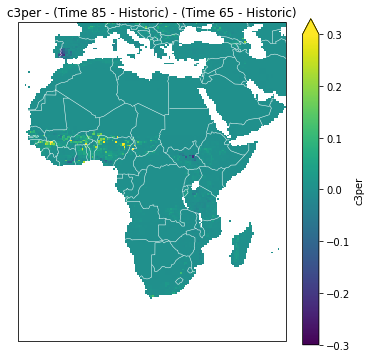

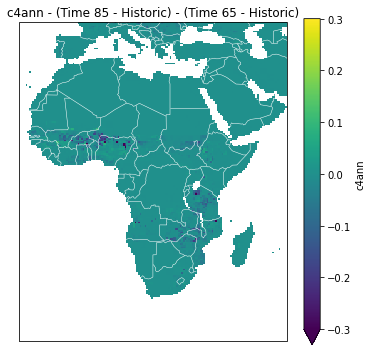

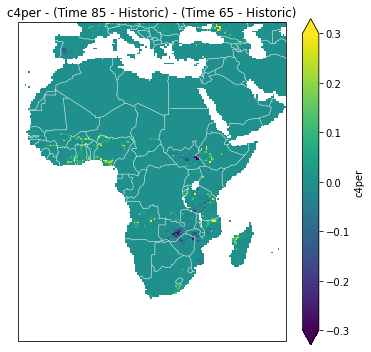

...

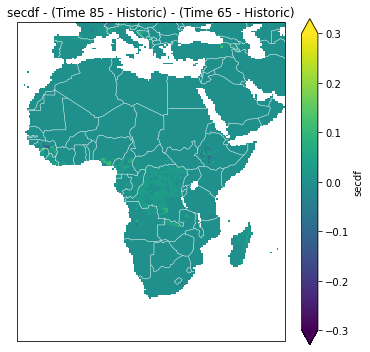

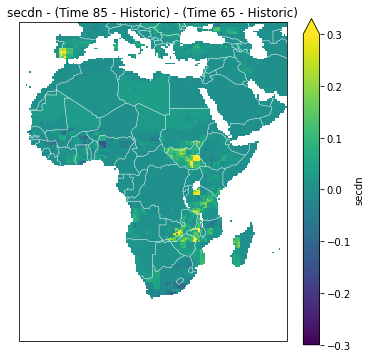

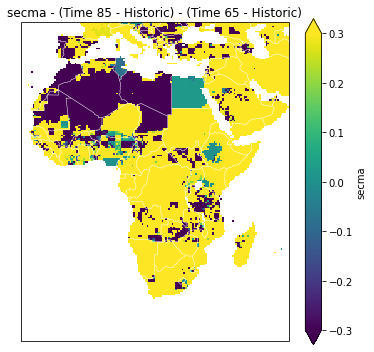

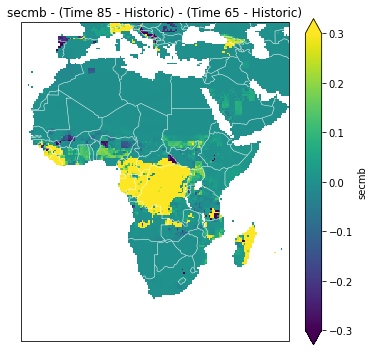

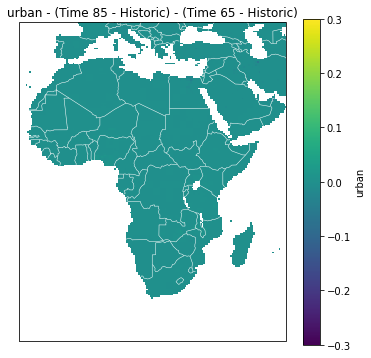

In [23]:
import warnings
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import xarray as xr

warnings.filterwarnings('ignore', category=UserWarning)
LandUseList = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_ssp126.nc"

ncfname = LandUseList
da_landuse = xr.open_dataset(ncfname, decode_times=False)
da_landuse = da_landuse.isel(time=[35, 65, 85])

LUH_historic = "/storage/workspaces/wa_climate/climate_trt/chari/LUH2/remapped_luh2_historical.nc"

da_historic = xr.open_dataset(LUH_historic, decode_times=False)
da_historic = da_historic.isel(time=1146)

# Create a list of variable names excluding 'time_bnds'
variables = [var for var in da_landuse.data_vars if var != 'time_bnds']

# Plot (85 - historic) - (65 - historic) for each variable
for var in variables:
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 6), subplot_kw={'projection': ccrs.PlateCarree()})

    # Compute the difference (85 - historic) - (65 - historic)
    diff = (da_landuse[var].isel(time=2) - da_historic[var]) - (da_landuse[var].isel(time=1) - da_historic[var])

    # Plot data
    im = diff.plot.imshow(x='lon', y='lat', transform=ccrs.PlateCarree(), cmap='viridis', ax=axes, vmin=-0.3, vmax=0.3)

    # Set map extent and add borders
    axes.set_extent((-20, 60, -40, 40))
    axes.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)

    # Title
    axes.set_title(f"{var} - (Time 85 - Historic) - (Time 65 - Historic)")

    # Colorbar
    #cbar = plt.colorbar(im, ax=axes, orientation='horizontal', pad=0.05)
    #cbar.set_label('Difference')

    # Show the plot
    plt.show()
